In [1]:
# !pip install pandas transformers scikit-learn matplotlib seaborn sentencepiece accelerate -q
# !pip install protobuf

# import pandas as pd
# hate_yes_data = pd.read_csv('/root/ccs_aisf/data/yes_no/hate_vs_antagonist_yes.csv')
# hate_no_data = pd.read_csv('/root/ccs_aisf/data/yes_no/hate_vs_antagonist_no.csv')

# torch.set_default_tensor_type(torch.cuda.HalfTensor)

## **1. Datasets.**

In [1]:
import re
import pickle
import pandas as pd
from sklearn.metrics import accuracy_score
import torch
import torch.nn.functional as F
from transformers import AutoTokenizer, AutoModelForMaskedLM, AutoModelForSequenceClassification
# from transformers import EncoderDecoderModel, BertTokenizer, DistilBertTokenizer
# from transformers import AutoModelForCausalLM

from sklearn.linear_model import LogisticRegression
import numpy as np
from tqdm import tqdm

import sys
import os

# Add the code directory directly to Python path
code_dir = '/Users/elenaericheva/ericheva_git/ccs_aisf/code'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

print(f"Added {code_dir} to Python path")

/Users/elenaericheva/ericheva_git/ccs_aisf/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Added /Users/elenaericheva/ericheva_git/ccs_aisf/code to Python path


## **2. Choose model.**

In [3]:
"""
T5 Gemma – encoder‑decoder (Seq2Seq)
-----------------------------------
We loop over every HF ID so you can pick ’n mix or just run them all.
"""

from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import torch

# Every official checkpoint ➜ comment explains what it is
T5GEMMA_CHECKPOINTS = {
    # -------- 2 B encoder · 2 B decoder --------
    "google/t5gemma-2b-2b-ul2":        "# 2B‑2B · UL2 pre‑training",
    "google/t5gemma-2b-2b-ul2-it":     "# 2B‑2B · UL2 · instruction‑tuned",
    "google/t5gemma-2b-2b-prefixlm":   "# 2B‑2B · PrefixLM pre‑training",
    "google/t5gemma-2b-2b-prefixlm-it":"# 2B‑2B · PrefixLM · instruction‑tuned",

    # -------- 9 B encoder · 2 B decoder --------
    "google/t5gemma-9b-2b-ul2":        "# 9B‑2B · UL2",
    "google/t5gemma-9b-2b-ul2-it":     "# 9B‑2B · UL2 · IT",
    "google/t5gemma-9b-2b-prefixlm":   "# 9B‑2B · PrefixLM",
    "google/t5gemma-9b-2b-prefixlm-it":"# 9B‑2B · PrefixLM · IT",

    # -------- 9 B encoder · 9 B decoder --------
    "google/t5gemma-9b-9b-ul2":        "# 9B‑9B · UL2",
    "google/t5gemma-9b-9b-ul2-it":     "# 9B‑9B · UL2 · IT",
    "google/t5gemma-9b-9b-prefixlm":   "# 9B‑9B · PrefixLM",
    "google/t5gemma-9b-9b-prefixlm-it":"# 9B‑9B · PrefixLM · IT",

    # -------- Classic T5 size grid, Gemma recipe --------
    # Small (≈0.3 B)
    "google/t5gemma-s-s-ul2":          "# T5‑Small · UL2",
    "google/t5gemma-s-s-ul2-it":       "# T5‑Small · UL2 · IT",
    "google/t5gemma-s-s-prefixlm":     "# T5‑Small · PrefixLM",
    "google/t5gemma-s-s-prefixlm-it":  "# T5‑Small · PrefixLM · IT",

    # Base (≈0.6 B)
    "google/t5gemma-b-b-ul2":          "# T5‑Base · UL2",
    "google/t5gemma-b-b-ul2-it":       "# T5‑Base · UL2 · IT",
    "google/t5gemma-b-b-prefixlm":     "# T5‑Base · PrefixLM",
    "google/t5gemma-b-b-prefixlm-it":  "# T5‑Base · PrefixLM · IT",

    # Large (≈1 B)
    "google/t5gemma-l-l-ul2":          "# T5‑Large · UL2",
    "google/t5gemma-l-l-ul2-it":       "# T5‑Large · UL2 · IT",
    "google/t5gemma-l-l-prefixlm":     "# T5‑Large · PrefixLM",
    "google/t5gemma-l-l-prefixlm-it":  "# T5‑Large · PrefixLM · IT",

    # Multi‑Large (≈2 B)
    "google/t5gemma-ml-ml-ul2":        "# T5‑ML · UL2",
    "google/t5gemma-ml-ml-ul2-it":     "# T5‑ML · UL2 · IT",
    "google/t5gemma-ml-ml-prefixlm":   "# T5‑ML · PrefixLM",
    "google/t5gemma-ml-ml-prefixlm-it":"# T5‑ML · PrefixLM · IT",

    # XL (≈4 B)
    "google/t5gemma-xl-xl-ul2":        "# T5‑XL · UL2",
    "google/t5gemma-xl-xl-ul2-it":     "# T5‑XL · UL2 · IT",
    "google/t5gemma-xl-xl-prefixlm":   "# T5‑XL · PrefixLM",
    "google/t5gemma-xl-xl-prefixlm-it":"# T5‑XL · PrefixLM · IT",
}

YOUR_NAME = "t5gemma-2b-2b-ul2"
print(f"\nLoading {"google/" + YOUR_NAME}")
tokenizer = AutoTokenizer.from_pretrained("google/" + YOUR_NAME)
model = AutoModelForSeq2SeqLM.from_pretrained(
    "google/" + YOUR_NAME,
    torch_dtype=torch.bfloat16,   # or "auto"
).to("cpu")
model.eval()                     # inference‑only by default



Loading google/t5gemma-2b-2b-ul2


Loading checkpoint shards: 100%|██████████| 3/3 [00:00<00:00, 15.46it/s]


T5GemmaForConditionalGeneration(
  (model): T5GemmaModel(
    (encoder): T5GemmaEncoder(
      (embed_tokens): Embedding(256000, 2304, padding_idx=0)
      (norm): T5GemmaRMSNorm((2304,), eps=1e-06)
      (rotary_emb): T5GemmaRotaryEmbedding()
      (layers): ModuleList(
        (0-25): 26 x T5GemmaEncoderLayer(
          (self_attn): T5GemmaSelfAttention(
            (q_proj): Linear(in_features=2304, out_features=2048, bias=False)
            (k_proj): Linear(in_features=2304, out_features=1024, bias=False)
            (v_proj): Linear(in_features=2304, out_features=1024, bias=False)
            (o_proj): Linear(in_features=2048, out_features=2304, bias=False)
          )
          (pre_self_attn_layernorm): T5GemmaRMSNorm((2304,), eps=1e-06)
          (post_self_attn_layernorm): T5GemmaRMSNorm((2304,), eps=1e-06)
          (mlp): T5GemmaMLP(
            (gate_proj): Linear(in_features=2304, out_features=9216, bias=False)
            (up_proj): Linear(in_features=2304, out_features=9

## **4. Plot.**

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from itertools import combinations
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: first-token): 100%|██████████| 1244/1244 [11:03<00:00,  1.87it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=250.000, min=-464.000, std=3.983


Extracting embeddings (strategy: first-token): 100%|██████████| 1244/1244 [10:34<00:00,  1.96it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=332.000, min=-454.000, std=3.970

► Plotting PCA for *encoder* embeddings …


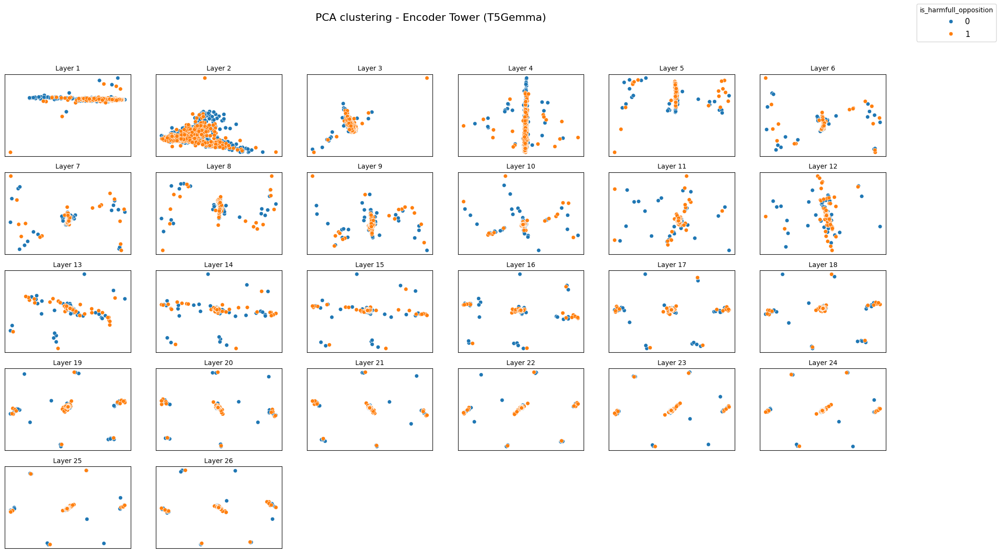

In [ ]:
# import torch
# import pandas as pd
# import numpy as np
# from extract_fixed_t5gemma import vectorize_df
# from format_results_fixed import plot_pca_or_tsne_layerwise


# # ──────────────────────────────────────────────────────────────────────────────
# # 2. Load your datasets
# # ──────────────────────────────────────────────────────────────────────────────

# hate_data           = pd.read_csv('../data/raw/total_hate_data.csv', index_col=0)
# hate_total_yes_data = pd.read_csv('../data/yes_no/hate_total_yes_data.csv', index_col=0)
# hate_total_no_data  = pd.read_csv('../data/yes_no/hate_total_no_data.csv',  index_col=0)

# # ──────────────────────────────────────────────────────────────────────────────
# # 3. Helper to run vectorise‑>save‑>normalise in one go
# # ──────────────────────────────────────────────────────────────────────────────
# def embed_and_normalise(df_text, tower_tag, strategy, use_decoder, model, tokenizer):
#     """Returns L2‑normalised (n_samples, n_layers, dim) GPU tensor"""
#     # CHANGED: Use GPU device and return GPU tensor
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
#     X = vectorize_df(df_text,
#                      model, tokenizer,
#                      strategy=strategy, 
#                      model_type="encoder-decoder",
#                      use_decoder=use_decoder,
#                      get_all_hs=True,
#                      device=device)  # CHANGED: Use GPU

#     # CHANGED: Save CPU version but keep GPU tensor for return
#     np.savez_compressed(f"{YOUR_NAME}_{tower_tag}_{strategy}.npz", X.cpu().numpy())

#     # CHANGED: L2-normalize on GPU
#     X_flat = X.view(-1, X.shape[-1])
#     X_norm = torch.nn.functional.normalize(X_flat, p=2, dim=1).view(X.shape)

#     # CHANGED: Save normalized version
#     # np.savez_compressed(f"{YOUR_NAME}_{tower_tag}_{strategy}_norm.npz", X_norm.cpu().numpy())
#     return X_norm  # CHANGED: Return GPU tensor

# # ──────────────────────────────────────────────────────────────────────────────
# # 4‑A. Encoder tower  (mean token works best)
# # ──────────────────────────────────────────────────────────────────────────────
# print("\n► Extracting *encoder* embeddings …")
# X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
#                                 tower_tag="enc_pos",
#                                 strategy="first-token",
#                                 use_decoder=False,
#                                 model=model,
#                                 tokenizer=tokenizer)

# X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
#                                 tower_tag="enc_neg",
#                                 strategy="first-token",
#                                 use_decoder=False,
#                                 model=model,
#                                 tokenizer=tokenizer)

# # CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
# X_pos_enc = X_pos_enc.cpu().numpy()
# X_neg_enc = X_neg_enc.cpu().numpy()

# print("\n► Plotting PCA for *encoder* embeddings …")
# plot_pca_or_tsne_layerwise(X_pos_enc,
#                            X_neg_enc,
#                            hate_data['is_harmfull_opposition'],
#                            standardize=False, n_components=5,
#                            components=[0, 1], mode='pca',
#                            plot_title='PCA clustering - Encoder Tower (T5Gemma)')





► Extracting *encoder* embeddings …


Extracting embeddings (strategy: last-token): 100%|██████████| 1244/1244 [09:47<00:00,  2.12it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=96.000, min=-241.000, std=4.081


Extracting embeddings (strategy: last-token): 100%|██████████| 1244/1244 [09:25<00:00,  2.20it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=88.000, min=-198.000, std=3.819

► Plotting PCA for *encoder* embeddings …


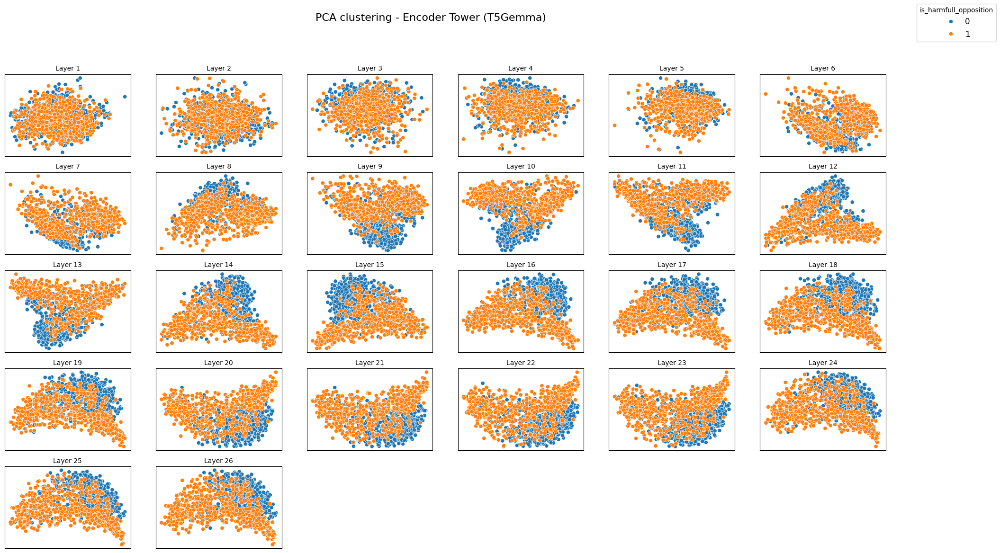

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑A. Encoder tower  (mean token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="enc_pos",
                                strategy="last-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="enc_neg",
                                strategy="last-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_enc = X_pos_enc.cpu().numpy()
X_neg_enc = X_neg_enc.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_enc,
                           X_neg_enc,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: mean): 100%|██████████| 1244/1244 [07:55<00:00,  2.62it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=241.375, min=-622.500, std=3.641


Extracting embeddings (strategy: mean): 100%|██████████| 1244/1244 [08:13<00:00,  2.52it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=243.599, min=-604.750, std=3.570

► Plotting PCA for *encoder* embeddings …


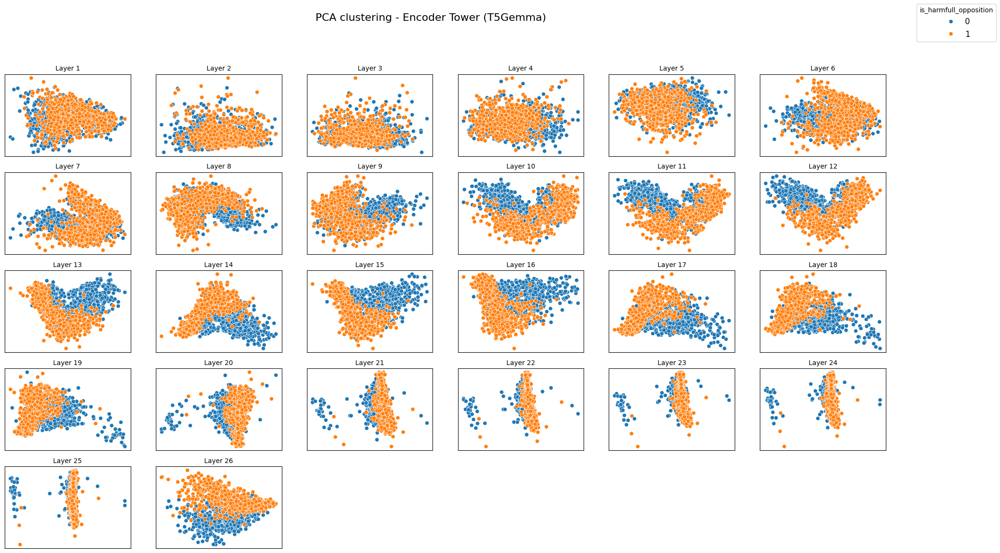

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑A. Encoder tower  (mean token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="enc_pos",
                                strategy="mean",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="enc_neg",
                                strategy="mean",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_enc = X_pos_enc.cpu().numpy()
X_neg_enc = X_neg_enc.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_enc,
                           X_neg_enc,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')


► Extracting *decoder* embeddings …


Extracting embeddings (strategy: first-token): 100%|██████████| 1244/1244 [17:15<00:00,  1.20it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=952.000, min=-408.000, std=16.406


Extracting embeddings (strategy: first-token): 100%|██████████| 1244/1244 [16:13<00:00,  1.28it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=952.000, min=-410.000, std=16.384

► Plotting PCA for *encoder* embeddings …


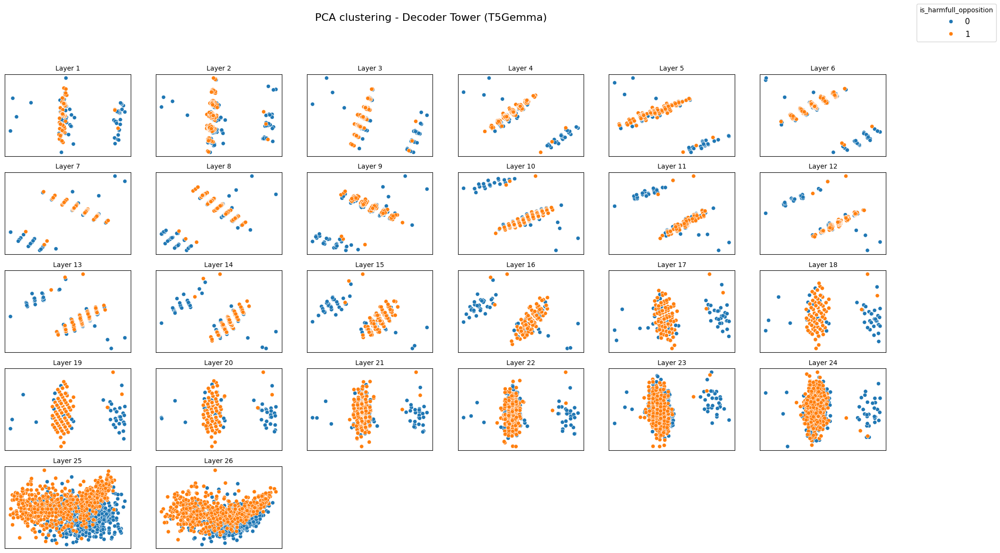

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *decoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="first-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="first-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Decoder Tower (T5Gemma)')


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: mean): 100%|██████████| 1244/1244 [15:38<00:00,  1.33it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=164.469, min=-117.338, std=2.666


Extracting embeddings (strategy: mean): 100%|██████████| 1244/1244 [18:50<00:00,  1.10it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=163.391, min=-118.500, std=2.637

► Plotting PCA for *encoder* embeddings …


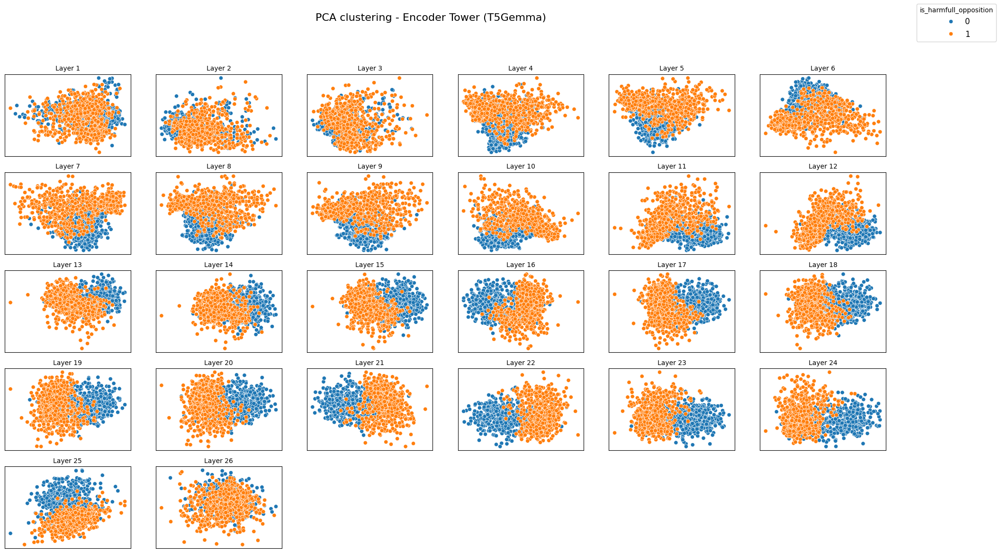

In [9]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="mean",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="mean",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')

In [11]:
import numpy as np
import torch
from tqdm import tqdm


def get_llm_type(model_cfg) -> str:
    """
    Determine the model type based on configuration
    """
    if model_cfg.config.is_encoder_decoder:
        return "encoder-decoder"

    model_type = model_cfg.config.model_type.lower()
    if model_type in [
        "bert",
        "roberta",
        "distilbert",
        "albert",
        "deberta",
        "deberta-v2",
    ]:
        return "encoder"
    elif model_type in [
        "gpt2",
        "gpt",
        "gptj",
        "gpt_neo",
        "gpt_neox",
        "llama",
        "bloom",
        "opt",
        "falcon",
        "gemma",
    ]:
        return "decoder"

    return "unknown"


def extract_representation(
    model,
    tokenizer,
    text,
    layer_index=None,
    get_all_hs=False,
    strategy="last-token",
    model_type=None,
    use_decoder=False,
    device=None,
    token_number=None,
):
    """
    FIXED: Extracts the vector representation from the given model layer or all model layers.
    MAJOR CHANGE: Proper encoder-decoder handling with meaningful decoder input for different strategies.

    Args:
        - model: HuggingFace model
        - tokenizer: model tokenizer
        - text: input string
        - layer_index: layer number (as default middle layer)
        - strategy: 'first-token' (for encoders), 'last-token' (for decoders), 'mean', or 'custom'
        - model_type: "encoder", "encoder-decoder", "decoder"
        - use_decoder: if True use decoder hidden states (for encoder-decoder models)
        - device: computation device
        - token_number: specific token position for 'custom' strategy

    Return:
        - torch.Tensor (n_layers, dim) if get_all_hs=True, else (dim,) - kept on GPU
    """
    # Enhanced device handling - prefer GPU
    if device is None:
        if torch.cuda.is_available():
            device = torch.device("cuda")
        elif torch.backends.mps.is_available():
            device = torch.device("mps")
        elif hasattr(model, "device"):
            device = model.device
        else:
            device = torch.device("cpu")
    else:
        device = torch.device(device)

    # Enhanced model type detection
    if model_type is None:
        model_type = get_llm_type(model)

    # MAJOR CHANGE: Proper encoder-decoder handling for T5GemmaForConditionalGeneration
    if model_type == "encoder-decoder":
        # Tokenize input for encoder
        enc_inputs = tokenizer(
            text, return_tensors="pt", padding=True, truncation=True, max_length=512
        ).to(device)
        
        # Check for empty inputs
        if enc_inputs["input_ids"].shape[1] == 0:
            raise ValueError("Empty input tensor detected - check tokenization")

        if use_decoder:
            # CHANGED: Create decoder input sequence for multiple token positions
            # The decoder receives encoder outputs internally, we just need decoder input tokens
            
            # Get appropriate decoder start token
            if hasattr(tokenizer, 'decoder_start_token_id') and tokenizer.decoder_start_token_id is not None:
                decoder_start_token_id = tokenizer.decoder_start_token_id
            elif hasattr(tokenizer, 'bos_token_id') and tokenizer.bos_token_id is not None:
                decoder_start_token_id = tokenizer.bos_token_id
            elif hasattr(tokenizer, 'pad_token_id') and tokenizer.pad_token_id is not None:
                decoder_start_token_id = tokenizer.pad_token_id
            else:
                decoder_start_token_id = 0  # fallback
            
            batch_size = enc_inputs["input_ids"].shape[0]
            encoder_length = enc_inputs["input_ids"].shape[1]
            
            # MAJOR FIX: Create decoder input with multiple tokens so different strategies work
            # Use the full encoder input as decoder input (this is common practice)
            # The encoder-decoder attention will handle the actual encoder output connection
            decoder_input_ids = torch.cat([
                torch.full((batch_size, 1), decoder_start_token_id, dtype=torch.long, device=device),
                enc_inputs["input_ids"][:, :-1]  # Shift right: remove last token, prepend start token
            ], dim=1)
            
            # Create proper attention mask for decoder input
            decoder_attention_mask = torch.cat([
                torch.ones((batch_size, 1), device=device),  # Start token is always attended
                enc_inputs.get("attention_mask", torch.ones_like(enc_inputs["input_ids"]))[:, :-1]
            ], dim=1)
            
            with torch.no_grad():
                # CHANGED: Normal encoder-decoder forward pass
                # Encoder processes input, decoder receives encoder outputs + decoder input
                outputs = model(
                    input_ids=enc_inputs["input_ids"],
                    attention_mask=enc_inputs.get("attention_mask", None),
                    decoder_input_ids=decoder_input_ids,
                    decoder_attention_mask=decoder_attention_mask,
                    output_hidden_states=True
                )
                
                # Use decoder hidden states - now has multiple positions for different strategies
                hs_tuple = outputs.decoder_hidden_states
                attention_mask = decoder_attention_mask  # Use decoder attention mask for strategies
                
        else:
            # CHANGED: For encoder extraction, use encoder_hidden_states from full forward pass
            with torch.no_grad():
                # Use a minimal decoder input to get encoder hidden states
                dummy_decoder_input = torch.full(
                    (enc_inputs["input_ids"].shape[0], 1), 
                    tokenizer.pad_token_id if tokenizer.pad_token_id is not None else 0,
                    dtype=torch.long, 
                    device=device
                )
                
                outputs = model(
                    input_ids=enc_inputs["input_ids"],
                    attention_mask=enc_inputs.get("attention_mask", None),
                    decoder_input_ids=dummy_decoder_input,
                    output_hidden_states=True
                )
                
                hs_tuple = outputs.encoder_hidden_states
                attention_mask = enc_inputs.get("attention_mask", None)

    # Encoder only OR Decoder only models
    else:
        inputs = tokenizer(
            text, return_tensors="pt", padding=True, truncation=True, max_length=512
        ).to(device)
        
        attention_mask = inputs.get("attention_mask", None)
        
        # Check for empty inputs
        if inputs["input_ids"].shape[1] == 0:
            raise ValueError("Empty input tensor detected - check tokenization")
            
        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            hs_tuple = outputs["hidden_states"]

    # Enhanced extraction logic with proper handling for all cases, keep on GPU
    if get_all_hs:
        reps = []
        for layer_idx, layer_h in enumerate(hs_tuple):
            # Keep on GPU and convert to float32
            layer_h = layer_h.float()

            # Check for empty tensors
            if layer_h.shape[1] == 0:
                print(f"Warning: Empty hidden states at layer {layer_idx}, skipping...")
                continue

            # Handle different extraction strategies properly
            if strategy == "first-token":
                # Use first token (good for encoder models)
                extracted = layer_h[:, 0, :].squeeze(0)

            elif strategy == "last-token":
                # Use attention mask to find actual last token, not padding
                if attention_mask is not None and attention_mask.shape[1] > 0:
                    # Find last non-padding token for each sequence
                    # FIXED: Ensure indices are long integers
                    last_token_indices = (attention_mask.sum(dim=1) - 1).long()
                    batch_size = layer_h.shape[0]

                    if batch_size == 1:
                        # Single sequence case
                        last_hidden = layer_h[0, last_token_indices[0], :]
                        extracted = last_hidden
                    else:
                        # Multiple sequences case
                        last_hidden = layer_h[
                            torch.arange(batch_size, device=device, dtype=torch.long), last_token_indices
                        ]
                        extracted = last_hidden.squeeze()
                else:
                    # Fallback to simple last token if no attention mask
                    extracted = layer_h[:, -1, :].squeeze(0)

            elif strategy == "mean":
                # Use attention mask for proper mean pooling (exclude padding), keep on GPU
                if attention_mask is not None and attention_mask.shape[1] > 0:
                    # Expand mask to match hidden states dimensions
                    expanded_mask = (
                        attention_mask.unsqueeze(-1).expand(layer_h.size()).float()
                    )
                    # Mask out padding tokens
                    masked_hidden = layer_h * expanded_mask
                    # Sum and divide by actual sequence length
                    summed = torch.sum(masked_hidden, dim=1)
                    lengths = torch.sum(expanded_mask, dim=1)
                    # Avoid division by zero
                    lengths = torch.clamp(lengths, min=1.0)
                    mean_hidden = summed / lengths
                    extracted = mean_hidden.squeeze(0)
                else:
                    # Fallback to simple mean if no attention mask
                    extracted = layer_h.mean(dim=1).squeeze(0)

            elif strategy == "custom":
                # Add bounds checking for custom token number
                if token_number is not None:
                    seq_len = layer_h.shape[1]
                    if token_number < seq_len:
                        extracted = layer_h[:, token_number, :].squeeze(0)
                    else:
                        # Fallback to last available token if token_number is out of bounds
                        extracted = layer_h[:, -1, :].squeeze(0)
                        print(
                            f"Warning: token_number {token_number} >= seq_len {seq_len}, using last token"
                        )
                else:
                    raise ValueError(
                        "token_number must be specified for 'custom' strategy"
                    )

            else:
                raise ValueError(
                    "strategy must be 'mean', 'last-token', 'first-token', or 'custom'"
                )

            # Keep as GPU tensor, ensure float32 and handle any remaining numerical issues
            extracted = extracted.float()

            # Replace any inf/nan values with zeros on GPU
            extracted = torch.where(torch.isfinite(extracted), extracted, torch.zeros_like(extracted))

            reps.append(extracted)

        # Return as GPU tensor stack
        if len(reps) == 0:
            raise ValueError("No valid hidden states extracted")
            
        result = torch.stack(reps).float()

        # Final check for extreme values and clip if necessary, on GPU
        max_abs_val = torch.max(torch.abs(result))
        if max_abs_val > 1000:
            # print(
            #     f"Warning: Extreme values detected (max: {max_abs_val:.2f}), applying clipping..."
            # )
            clip_value = torch.quantile(torch.abs(result.flatten()), 0.995)
            result = torch.clamp(result, -clip_value, clip_value)

        return result

    else:
        # Single layer extraction
        if layer_index is None:
            layer_index = len(hs_tuple) // 2  # middle layer as default

        # Add bounds checking for layer_index
        if layer_index >= len(hs_tuple):
            layer_index = len(hs_tuple) - 1
            print(f"Warning: layer_index out of bounds, using layer {layer_index}")

        hs = hs_tuple[layer_index][0].float()  # Convert to float32

        # Check for empty hidden states
        if hs.shape[0] == 0:
            raise ValueError("Empty hidden states detected")

        # Apply same enhanced logic for single layer extraction
        if strategy == "mean":
            if attention_mask is not None and attention_mask.shape[1] > 0:
                expanded_mask = attention_mask.unsqueeze(-1).expand(hs.size()).float()
                masked_hidden = hs * expanded_mask
                summed = torch.sum(masked_hidden, dim=0)
                length = torch.sum(expanded_mask, dim=0)
                length = torch.clamp(length, min=1.0)  # Avoid division by zero
                result = (summed / length).float()
            else:
                result = hs.mean(dim=0).float()

        elif strategy == "first-token":
            result = hs[0].float()

        elif strategy == "last-token":
            if attention_mask is not None and attention_mask.shape[1] > 0:
                # FIXED: Ensure indices are long integers
                last_token_idx = (attention_mask.sum(dim=1) - 1).long()
                result = hs[last_token_idx[0]].float()
            else:
                result = hs[-1].float()

        elif strategy == "custom":
            if token_number is not None:
                seq_len = hs.shape[0]
                if token_number < seq_len:
                    result = hs[token_number].float()
                else:
                    result = hs[-1].float()
                    print(
                        f"Warning: token_number {token_number} >= seq_len {seq_len}, using last token"
                    )
            else:
                raise ValueError("token_number must be specified for 'custom' strategy")
        else:
            raise ValueError(
                "strategy must be 'mean', 'last-token', 'first-token', or 'custom'"
            )

        # Clean up result on GPU
        result = torch.where(torch.isfinite(result), result, torch.zeros_like(result))
        return result


def vectorize_df(
    df_text,
    model,
    tokenizer,
    layer_index=None,
    strategy="last-token",
    model_type=None,
    use_decoder=False,
    get_all_hs=False,
    device=None,
    token_number=None,
):
    """
    Converts the df_text to an embedding matrix keeping everything on GPU
    Enhanced with better error handling and progress reporting.

    Args:
        df_text: list or pandas Series with text data
        model: HuggingFace model
        tokenizer: tokenizer
        layer_index: layer index (int or None - middle layer as default)
        strategy: 'first-token', 'last-token', 'mean', or 'custom'
        model_type: str ('encoder', 'encoder-decoder', 'decoder')
        use_decoder: use decoder hidden states for encoder-decoder models
        get_all_hs: extract all hidden states layers
        device: computation device
        token_number: specific token position for 'custom' strategy

    Return:
        torch.Tensor (n_samples, n_layers, hidden_dim) if get_all_hs=True - kept on GPU
        torch.Tensor (n_samples, hidden_dim) if get_all_hs=False - kept on GPU
    """
    # Prefer GPU device
    if device is None:
        if torch.cuda.is_available():
            device = torch.device("cuda")
        elif torch.backends.mps.is_available():
            device = torch.device("mps")
        elif hasattr(model, "device"):
            device = model.device
        else:
            device = torch.device("cpu")
    else:
        device = torch.device(device)
    
    embeddings = []
    failed_extractions = 0

    # Better progress bar with more information
    for idx in tqdm(
        range(len(df_text)), desc=f"Extracting embeddings (strategy: {strategy})"
    ):
        # Handle different input types (list, pandas Series, etc.)
        if hasattr(df_text, "iloc"):
            text = df_text.iloc[idx]
        else:
            text = df_text[idx]

        # Skip empty or None texts
        if text is None or (isinstance(text, str) and len(text.strip()) == 0):
            print(f"Warning: Empty text at index {idx}, skipping...")
            failed_extractions += 1
            continue

        # Wrapped in explicit error checking instead of try-except
        text_valid = isinstance(text, str) and len(text.strip()) > 0
        if not text_valid:
            print(f"Warning: Invalid text at index {idx}, skipping...")
            failed_extractions += 1
            continue

        vec = extract_representation(
            model=model,
            tokenizer=tokenizer,
            text=text,
            layer_index=layer_index,
            strategy=strategy,
            model_type=model_type,
            use_decoder=use_decoder,
            get_all_hs=get_all_hs,
            device=device,
            token_number=token_number,
        )
        embeddings.append(vec)

    if failed_extractions > 0:
        print(
            f"Warning: {failed_extractions} extractions failed and were skipped"
        )

    # Better error handling for empty results
    if len(embeddings) == 0:
        raise ValueError("No successful extractions - all texts failed to process")

    # Stack tensors on GPU instead of converting to numpy
    first_shape = embeddings[0].shape
    all_same_shape = all(emb.shape == first_shape for emb in embeddings)
    
    if not all_same_shape:
        print("Warning: Inconsistent embedding shapes detected, attempting to fix...")
        # Find max dimensions
        if len(first_shape) == 1:
            max_dim = max(emb.shape[0] for emb in embeddings)
            padded_embeddings = []
            for emb in embeddings:
                if emb.shape[0] < max_dim:
                    padding = torch.zeros(max_dim - emb.shape[0], device=device, dtype=emb.dtype)
                    padded = torch.cat([emb, padding], dim=0)
                    padded_embeddings.append(padded)
                else:
                    padded_embeddings.append(emb)
            embeddings = padded_embeddings
        elif len(first_shape) == 2:
            max_dim0 = max(emb.shape[0] for emb in embeddings)
            max_dim1 = max(emb.shape[1] for emb in embeddings)
            padded_embeddings = []
            for emb in embeddings:
                if emb.shape[0] < max_dim0 or emb.shape[1] < max_dim1:
                    padded = torch.zeros(max_dim0, max_dim1, device=device, dtype=emb.dtype)
                    padded[:emb.shape[0], :emb.shape[1]] = emb
                    padded_embeddings.append(padded)
                else:
                    padded_embeddings.append(emb)
            embeddings = padded_embeddings

    # Stack as GPU tensor
    result = torch.stack(embeddings).float()

    # Final validation and cleanup on GPU
    print(f"Extraction completed: shape={result.shape}, dtype={result.dtype}, device={result.device}")
    result_max = torch.max(result)
    result_min = torch.min(result)
    result_std = torch.std(result)
    print(f"Stats: max={result_max:.3f}, min={result_min:.3f}, std={result_std:.3f}")

    # Final check for extreme values on GPU
    max_abs_val = torch.max(torch.abs(result))
    if max_abs_val > 1000:
        # print("Warning: Extreme values detected in final result, applying global clipping...")
        clip_value = torch.quantile(torch.abs(result.flatten()), 0.999)
        result = torch.clamp(result, -clip_value, clip_value)
        print(f"Applied clipping at ±{clip_value:.2f}")

    # Final check for inf/nan on GPU
    inf_count = torch.sum(torch.isinf(result))
    nan_count = torch.sum(torch.isnan(result))
    if inf_count > 0 or nan_count > 0:
        print(f"Warning: Found {inf_count} inf and {nan_count} nan values, replacing with zeros...")
        result = torch.where(torch.isfinite(result), result, torch.zeros_like(result))

    return result


# Additional utility functions for model-specific configurations
def get_recommended_strategy(model_type):
    """
    Get recommended extraction strategy based on model type
    """
    if model_type == "encoder":
        return "first-token"
    elif model_type == "decoder":
        return "last-token"
    elif model_type == "encoder-decoder":
        return "mean"  # or "last-token" if using decoder
    else:
        return "mean"  # safe default


def validate_extraction_params(model, tokenizer, model_type, strategy):
    """
    Validate that extraction parameters make sense for the given model
    """
    detected_type = get_llm_type(model)

    if model_type != detected_type:
        print(
            f"Warning: model_type '{model_type}' doesn't match detected type '{detected_type}'"
        )

    recommended_strategy = get_recommended_strategy(detected_type)
    if strategy != recommended_strategy:
        print(
            f"Info: Using strategy '{strategy}', but '{recommended_strategy}' is recommended for {detected_type} models"
        )


# Example usage configurations for different models
def get_deberta_config():
    """Configuration for DeBERTa model"""
    return {
        "strategy": "first-token",
        "model_type": "encoder",
        "use_decoder": False,
        "get_all_hs": True,
    }


def get_gemma_config():
    """Configuration for Gemma model"""
    return {
        "strategy": "last-token",
        "model_type": "decoder",
        "use_decoder": False,
        "get_all_hs": True,
    }


def get_t5_config(use_decoder=True):
    """Configuration for T5 model"""
    return {
        "strategy": "last-token" if use_decoder else "first-token",
        "model_type": "encoder-decoder",
        "use_decoder": use_decoder,
        "get_all_hs": True,
    }


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: last-token): 100%|██████████| 1244/1244 [16:58<00:00,  1.22it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=111.000, min=-140.000, std=3.205


Extracting embeddings (strategy: last-token): 100%|██████████| 1244/1244 [15:24<00:00,  1.35it/s]


Extraction completed: shape=torch.Size([1244, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=94.500, min=-159.000, std=3.278

► Plotting PCA for *encoder* embeddings …


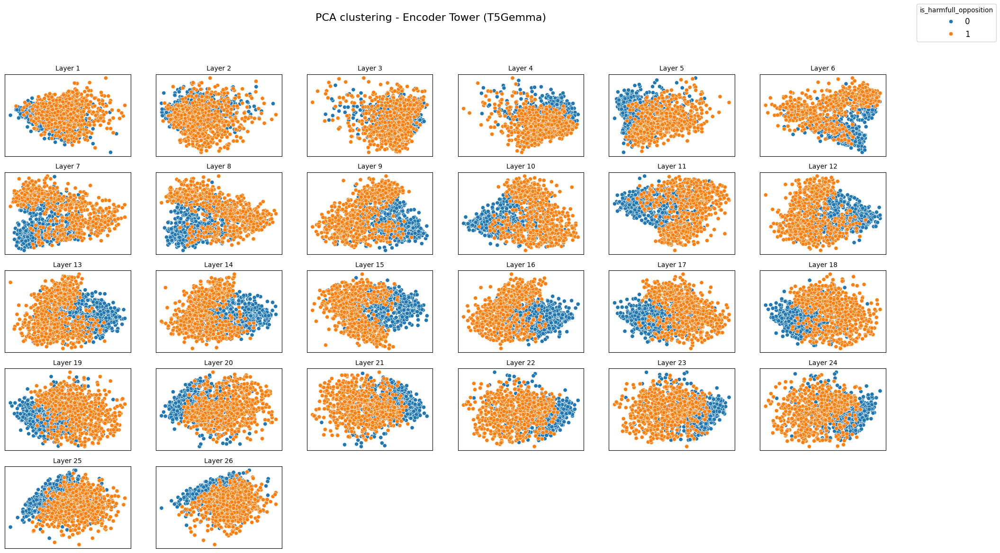

In [12]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="last-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="last-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')

## **5. Find best CCS**


To find the best layers, train CCS on all hidden states. You can use different normalization strategies, the best in experiments was l2 + median.

In [2]:
import random, numpy as np, torch, pickle, matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from ccs import train_ccs_on_hidden_states
import sys
import os

# Add the code directory directly to Python path
code_dir = '/Users/elenaericheva/ericheva_git/ccs_aisf/code'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

print(f"Added {code_dir} to Python path")

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.backends.cudnn.deterministic, torch.backends.cudnn.benchmark = True, False

def run_ccs(X_pos_norm, X_neg_norm, *, tower_tag):
    # Train / test split once per tower
    idx              = np.arange(len(X_pos_norm))
    train_idx, test_idx = train_test_split(idx, test_size=0.2,
                                           random_state=71, shuffle=True)

    # CCS
    ccs_layers = train_ccs_on_hidden_states(X_pos_norm,
                                            X_neg_norm,
                                            hate_data['is_harmfull_opposition'],
                                            train_idx, test_idx,
                                            normalizing='median')

    # save
    with open(f'ccs_{YOUR_NAME}_{tower_tag}_mixed_results.pkl', 'wb') as f:
        pickle.dump(ccs_layers, f)

    # Accuracy curve
    acc = [layer_data['accuracy'] for layer_idx, layer_data in ccs_layers.items()]

    plt.figure(); plt.plot(acc); plt.title(f'CCS accuracy per layer ({tower_tag})')
    plt.xlabel('Layer'); plt.ylabel('Accuracy'); plt.show()

    # Best layer
    best_layer = int(np.argmax(acc))
    print(f'► Best {tower_tag} layer = {best_layer}  (acc={acc[best_layer]:.3f})')
    return best_layer

Added /Users/elenaericheva/ericheva_git/ccs_aisf/code to Python path


After that, we train the CCS on the selected layer to obtain the probe and its weights.

Median normalize used
Layer 1/27, CCS accuracy: 0.5823293172690763
Median normalize used
Layer 2/27, CCS accuracy: 0.5783132530120482
Median normalize used
Layer 3/27, CCS accuracy: 0.5983935742971888
Median normalize used
Layer 4/27, CCS accuracy: 0.5823293172690763
Median normalize used
Layer 5/27, CCS accuracy: 0.5983935742971888
Median normalize used
Layer 6/27, CCS accuracy: 0.6024096385542169
Median normalize used
Layer 7/27, CCS accuracy: 0.606425702811245
Median normalize used
Layer 8/27, CCS accuracy: 0.5903614457831325
Median normalize used
Layer 9/27, CCS accuracy: 0.6666666666666667
Median normalize used
Layer 10/27, CCS accuracy: 0.606425702811245
Median normalize used
Layer 11/27, CCS accuracy: 0.6345381526104418
Median normalize used
Layer 12/27, CCS accuracy: 0.642570281124498
Median normalize used
Layer 13/27, CCS accuracy: 0.6746987951807228
Median normalize used
Layer 14/27, CCS accuracy: 0.7068273092369478
Median normalize used
Layer 15/27, CCS accuracy: 0.698795180

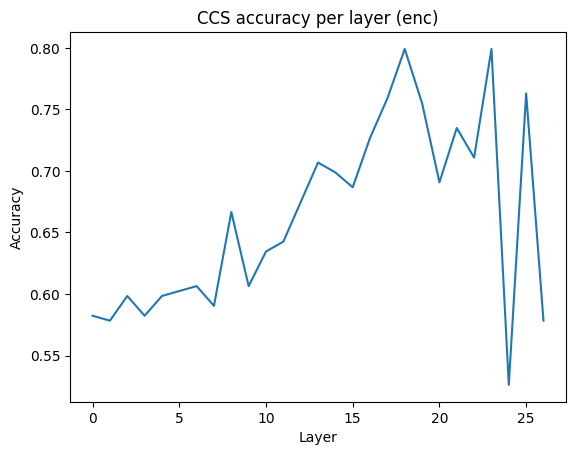

► Best enc layer = 18  (acc=0.799)


In [3]:
YOUR_NAME = "t5gemma-2b-2b-ul2"
hate_data = pd.read_csv('../data/raw/total_hate_data.csv', index_col=0)
X_pos_enc = np.load(f"{YOUR_NAME}_enc_pos_mean.npz")['arr_0']
X_neg_enc = np.load(f"{YOUR_NAME}_enc_neg_mean.npz")['arr_0']
best_enc_layer = run_ccs(X_pos_enc, X_neg_enc, tower_tag='enc')

Median normalize used
Layer 1/27, CCS accuracy: 0.5381526104417671
Median normalize used
Layer 2/27, CCS accuracy: 0.6305220883534136
Median normalize used
Layer 3/27, CCS accuracy: 0.570281124497992
Median normalize used
Layer 4/27, CCS accuracy: 0.5140562248995983
Median normalize used
Layer 5/27, CCS accuracy: 0.6827309236947792
Median normalize used
Layer 6/27, CCS accuracy: 0.7590361445783133
Median normalize used
Layer 7/27, CCS accuracy: 0.678714859437751
Median normalize used
Layer 8/27, CCS accuracy: 0.678714859437751
Median normalize used
Layer 9/27, CCS accuracy: 0.6706827309236948
Median normalize used
Layer 10/27, CCS accuracy: 0.6746987951807228
Median normalize used
Layer 11/27, CCS accuracy: 0.678714859437751
Median normalize used
Layer 12/27, CCS accuracy: 0.714859437751004
Median normalize used
Layer 13/27, CCS accuracy: 0.7550200803212851
Median normalize used
Layer 14/27, CCS accuracy: 0.7710843373493976
Median normalize used
Layer 15/27, CCS accuracy: 0.67469879518

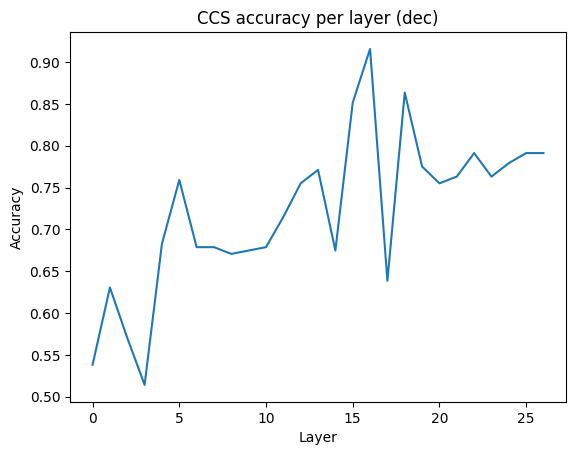

► Best dec layer = 16  (acc=0.916)


In [4]:
YOUR_NAME = "t5gemma-2b-2b-ul2"
hate_data = pd.read_csv('../data/raw/total_hate_data.csv', index_col=0)
X_pos_dec = np.load(f"{YOUR_NAME}_dec_pos_last-token.npz")['arr_0']
X_neg_dec = np.load(f"{YOUR_NAME}_dec_neg_last-token.npz")['arr_0']
best_dec_layer = run_ccs(X_pos_dec, X_neg_dec, tower_tag='dec')


In [7]:
from ccs import CCS
import pandas as pd, numpy as np, pickle
from sklearn.model_selection import train_test_split

def single_layer_ccs(X_pos_norm, X_neg_norm, best_layer, *, tower_tag):
    # Slice out the chosen layer
    X_pos_layer = pd.DataFrame(X_pos_norm[:, best_layer])
    X_neg_layer = pd.DataFrame(X_neg_norm[:, best_layer])

    idx = np.arange(len(X_pos_norm))
    train_idx, test_idx = train_test_split(idx, test_size=0.2,
                                           random_state=71, shuffle=True)

    # Train/test split
    X_pos_train = X_pos_layer.loc[train_idx].values.astype(np.float32)
    X_pos_test  = X_pos_layer.loc[test_idx].values.astype(np.float32)
    X_neg_train = X_neg_layer.loc[train_idx].values.astype(np.float32)
    X_neg_test  = X_neg_layer.loc[test_idx].values.astype(np.float32)

    y_train = hate_data['is_harmfull_opposition'][train_idx]
    y_test  = hate_data['is_harmfull_opposition'][test_idx]

    # Median normalise in‑place
    X_pos_train -= np.median(X_pos_train); X_pos_test -= np.median(X_pos_train)
    X_neg_train -= np.median(X_neg_train); X_neg_test -= np.median(X_neg_train)

    # CCS without labels (NEG first, then POS)
    ccs = CCS(X_neg_train, X_pos_train, y_train.values,
              var_normalize=False, lambda_classification=0,
              predict_normalize=False)
    ccs.repeated_train()

    acc = ccs.get_acc(X_neg_test, X_pos_test, y_test.values)
    print(f'CCS accuracy ({tower_tag}, layer {best_layer}) = {acc:.3f}')

    with open(f'ccs_{YOUR_NAME}_{tower_tag}_mixed_l{best_layer}.pkl', 'wb') as f:
        pickle.dump(ccs, f)

best_enc_layer = 18
best_dec_layer = 16
hate_data = pd.read_csv('../data/raw/total_hate_data.csv', index_col=0)
X_pos_enc = np.load(f"{YOUR_NAME}_enc_pos_mean.npz")['arr_0']
X_neg_enc = np.load(f"{YOUR_NAME}_enc_neg_mean.npz")['arr_0']
X_pos_dec = np.load(f"{YOUR_NAME}_dec_pos_last-token.npz")['arr_0']
X_neg_dec = np.load(f"{YOUR_NAME}_dec_neg_last-token.npz")['arr_0']

# Run for both towers
single_layer_ccs(X_pos_enc, X_neg_enc, best_enc_layer, tower_tag='enc')
single_layer_ccs(X_pos_dec, X_neg_dec, best_dec_layer, tower_tag='dec')


CCS accuracy (enc, layer 18) = 0.538
CCS accuracy (dec, layer 16) = 0.667


# NOT


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: first-token): 100%|██████████| 1250/1250 [08:03<00:00,  2.58it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=468.000, min=-980.000, std=3.961


Extracting embeddings (strategy: first-token): 100%|██████████| 1250/1250 [07:47<00:00,  2.67it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=258.000, min=-932.000, std=3.945

► Plotting PCA for *encoder* embeddings …


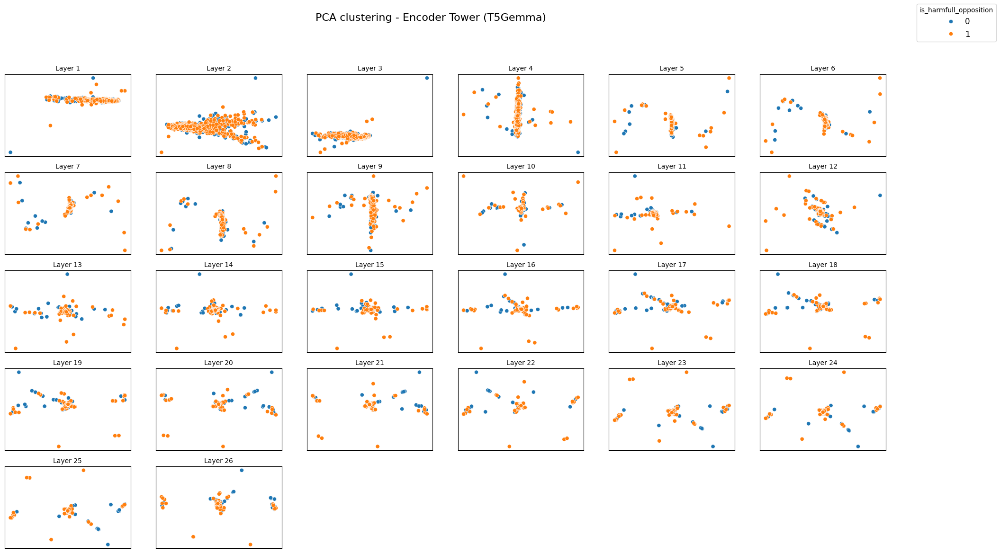

In [16]:
import torch
import pandas as pd
import numpy as np
from extract_fixed_t5gemma import vectorize_df
from format_results_fixed import plot_pca_or_tsne_layerwise


# ──────────────────────────────────────────────────────────────────────────────
# 2. Load your datasets
# ──────────────────────────────────────────────────────────────────────────────

hate_data           = pd.read_csv('../data/raw/total_hate3.0.csv', index_col=0)
hate_total_yes_data = pd.read_csv('../data/yes_no/hate_total3.0_yes.csv', index_col=0)
hate_total_no_data  = pd.read_csv('../data/yes_no/hate_total3.0_no.csv',  index_col=0)

# ──────────────────────────────────────────────────────────────────────────────
# 3. Helper to run vectorise‑>save‑>normalise in one go
# ──────────────────────────────────────────────────────────────────────────────
def embed_and_normalise(df_text, tower_tag, strategy, use_decoder, model, tokenizer):
    """Returns L2‑normalised (n_samples, n_layers, dim) GPU tensor"""
    # CHANGED: Use GPU device and return GPU tensor
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    X = vectorize_df(df_text,
                     model, tokenizer,
                     strategy=strategy, 
                     model_type="encoder-decoder",
                     use_decoder=use_decoder,
                     get_all_hs=True,
                     device=device)  # CHANGED: Use GPU

    # CHANGED: Save CPU version but keep GPU tensor for return
    np.savez_compressed(f"{YOUR_NAME}_{tower_tag}_{strategy}_not.npz", X.cpu().numpy())

    # CHANGED: L2-normalize on GPU
    X_flat = X.view(-1, X.shape[-1])
    X_norm = torch.nn.functional.normalize(X_flat, p=2, dim=1).view(X.shape)

    # CHANGED: Save normalized version
    # np.savez_compressed(f"{YOUR_NAME}_{tower_tag}_{strategy}_norm.npz", X_norm.cpu().numpy())
    return X_norm  # CHANGED: Return GPU tensor

# ──────────────────────────────────────────────────────────────────────────────
# 4‑A. Encoder tower  (mean token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="enc_pos",
                                strategy="first-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="enc_neg",
                                strategy="first-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_enc = X_pos_enc.cpu().numpy()
X_neg_enc = X_neg_enc.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_enc,
                           X_neg_enc,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')







► Extracting *encoder* embeddings …


Extracting embeddings (strategy: last-token): 100%|██████████| 1250/1250 [08:45<00:00,  2.38it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=92.000, min=-224.000, std=4.032


Extracting embeddings (strategy: last-token): 100%|██████████| 1250/1250 [07:26<00:00,  2.80it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=90.500, min=-194.000, std=3.835

► Plotting PCA for *encoder* embeddings …


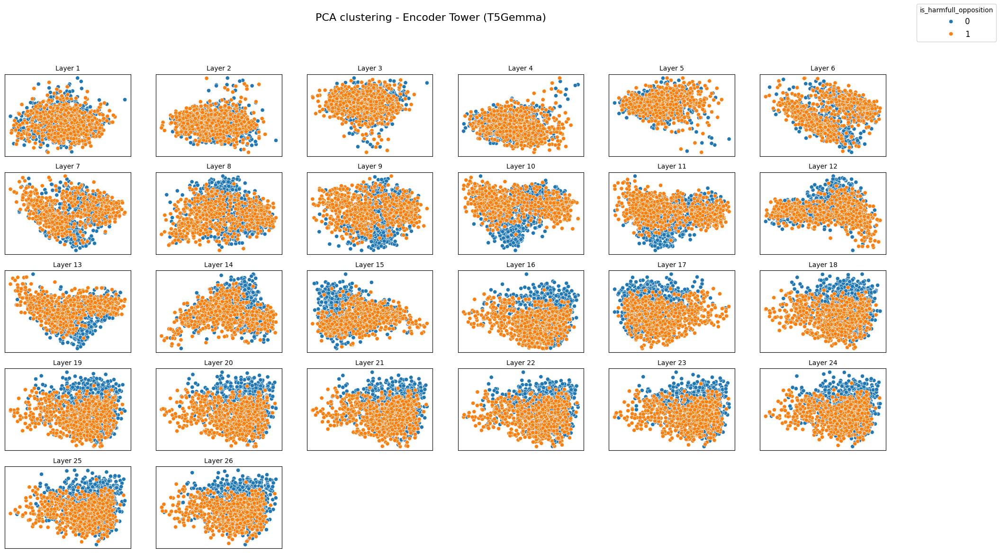

In [17]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑A. Encoder tower  (mean token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="enc_pos",
                                strategy="last-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="enc_neg",
                                strategy="last-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_enc = X_pos_enc.cpu().numpy()
X_neg_enc = X_neg_enc.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_enc,
                           X_neg_enc,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: mean): 100%|██████████| 1250/1250 [07:09<00:00,  2.91it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=232.016, min=-609.500, std=3.558


Extracting embeddings (strategy: mean): 100%|██████████| 1250/1250 [07:15<00:00,  2.87it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=232.901, min=-604.417, std=3.528

► Plotting PCA for *encoder* embeddings …


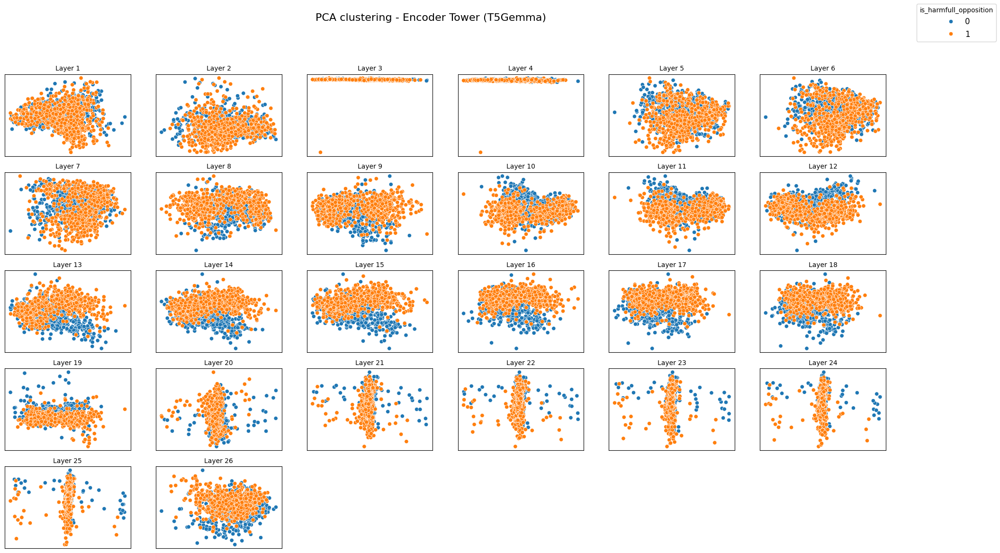

In [18]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑A. Encoder tower  (mean token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="enc_pos",
                                strategy="mean",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="enc_neg",
                                strategy="mean",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_enc = X_pos_enc.cpu().numpy()
X_neg_enc = X_neg_enc.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_enc,
                           X_neg_enc,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')


► Extracting *decoder* embeddings …


Extracting embeddings (strategy: first-token): 100%|██████████| 1250/1250 [12:54<00:00,  1.61it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=952.000, min=-410.000, std=16.387


Extracting embeddings (strategy: first-token): 100%|██████████| 1250/1250 [12:46<00:00,  1.63it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=952.000, min=-408.000, std=16.372

► Plotting PCA for *encoder* embeddings …


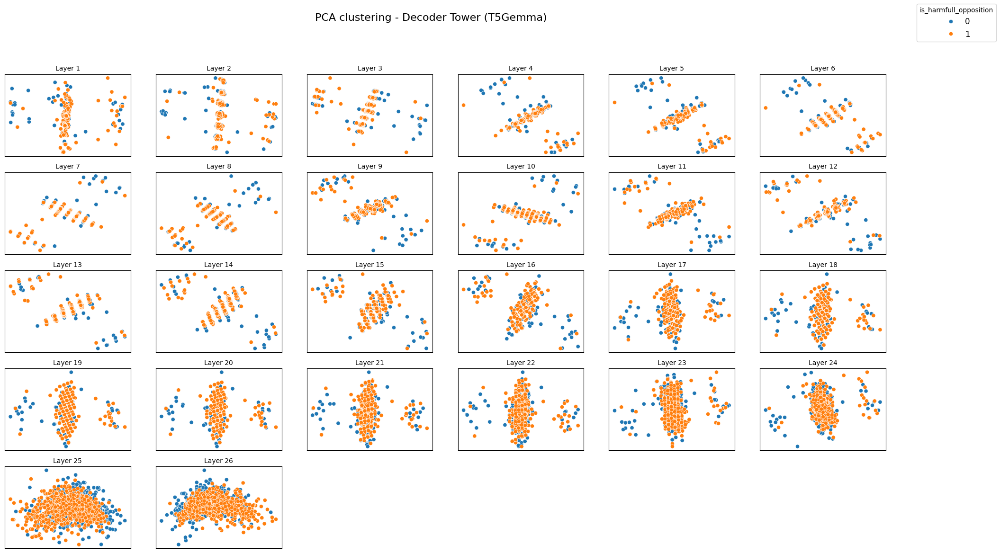

In [19]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *decoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="first-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="first-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Decoder Tower (T5Gemma)')


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: mean): 100%|██████████| 1250/1250 [12:44<00:00,  1.63it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=162.896, min=-114.700, std=2.639


Extracting embeddings (strategy: mean): 100%|██████████| 1250/1250 [12:47<00:00,  1.63it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=162.833, min=-114.208, std=2.624

► Plotting PCA for *encoder* embeddings …


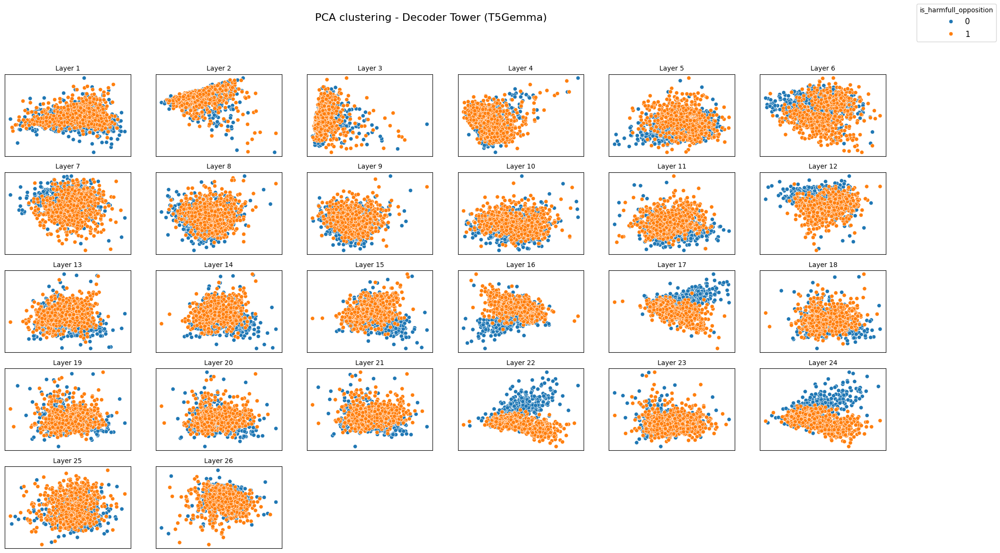

In [20]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="mean",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="mean",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Decoder Tower (T5Gemma)')

In [22]:
import numpy as np
import torch
from tqdm import tqdm


def get_llm_type(model_cfg) -> str:
    """
    Determine the model type based on configuration
    """
    if model_cfg.config.is_encoder_decoder:
        return "encoder-decoder"

    model_type = model_cfg.config.model_type.lower()
    if model_type in [
        "bert",
        "roberta",
        "distilbert",
        "albert",
        "deberta",
        "deberta-v2",
    ]:
        return "encoder"
    elif model_type in [
        "gpt2",
        "gpt",
        "gptj",
        "gpt_neo",
        "gpt_neox",
        "llama",
        "bloom",
        "opt",
        "falcon",
        "gemma",
    ]:
        return "decoder"

    return "unknown"


def extract_representation(
    model,
    tokenizer,
    text,
    layer_index=None,
    get_all_hs=False,
    strategy="last-token",
    model_type=None,
    use_decoder=False,
    device=None,
    token_number=None,
):
    """
    FIXED: Extracts the vector representation from the given model layer or all model layers.
    MAJOR CHANGE: Proper encoder-decoder handling with meaningful decoder input for different strategies.

    Args:
        - model: HuggingFace model
        - tokenizer: model tokenizer
        - text: input string
        - layer_index: layer number (as default middle layer)
        - strategy: 'first-token' (for encoders), 'last-token' (for decoders), 'mean', or 'custom'
        - model_type: "encoder", "encoder-decoder", "decoder"
        - use_decoder: if True use decoder hidden states (for encoder-decoder models)
        - device: computation device
        - token_number: specific token position for 'custom' strategy

    Return:
        - torch.Tensor (n_layers, dim) if get_all_hs=True, else (dim,) - kept on GPU
    """
    # Enhanced device handling - prefer GPU
    if device is None:
        if torch.cuda.is_available():
            device = torch.device("cuda")
        elif torch.backends.mps.is_available():
            device = torch.device("mps")
        elif hasattr(model, "device"):
            device = model.device
        else:
            device = torch.device("cpu")
    else:
        device = torch.device(device)

    # Enhanced model type detection
    if model_type is None:
        model_type = get_llm_type(model)

    # MAJOR CHANGE: Proper encoder-decoder handling for T5GemmaForConditionalGeneration
    if model_type == "encoder-decoder":
        # Tokenize input for encoder
        enc_inputs = tokenizer(
            text, return_tensors="pt", padding=True, truncation=True, max_length=512
        ).to(device)
        
        # Check for empty inputs
        if enc_inputs["input_ids"].shape[1] == 0:
            raise ValueError("Empty input tensor detected - check tokenization")

        if use_decoder:
            # CHANGED: Create decoder input sequence for multiple token positions
            # The decoder receives encoder outputs internally, we just need decoder input tokens
            
            # Get appropriate decoder start token
            if hasattr(tokenizer, 'decoder_start_token_id') and tokenizer.decoder_start_token_id is not None:
                decoder_start_token_id = tokenizer.decoder_start_token_id
            elif hasattr(tokenizer, 'bos_token_id') and tokenizer.bos_token_id is not None:
                decoder_start_token_id = tokenizer.bos_token_id
            elif hasattr(tokenizer, 'pad_token_id') and tokenizer.pad_token_id is not None:
                decoder_start_token_id = tokenizer.pad_token_id
            else:
                decoder_start_token_id = 0  # fallback
            
            batch_size = enc_inputs["input_ids"].shape[0]
            encoder_length = enc_inputs["input_ids"].shape[1]
            
            # MAJOR FIX: Create decoder input with multiple tokens so different strategies work
            # Use the full encoder input as decoder input (this is common practice)
            # The encoder-decoder attention will handle the actual encoder output connection
            decoder_input_ids = torch.cat([
                torch.full((batch_size, 1), decoder_start_token_id, dtype=torch.long, device=device),
                enc_inputs["input_ids"][:, :-1]  # Shift right: remove last token, prepend start token
            ], dim=1)
            
            # Create proper attention mask for decoder input
            decoder_attention_mask = torch.cat([
                torch.ones((batch_size, 1), device=device),  # Start token is always attended
                enc_inputs.get("attention_mask", torch.ones_like(enc_inputs["input_ids"]))[:, :-1]
            ], dim=1)
            
            with torch.no_grad():
                # CHANGED: Normal encoder-decoder forward pass
                # Encoder processes input, decoder receives encoder outputs + decoder input
                outputs = model(
                    input_ids=enc_inputs["input_ids"],
                    attention_mask=enc_inputs.get("attention_mask", None),
                    decoder_input_ids=decoder_input_ids,
                    decoder_attention_mask=decoder_attention_mask,
                    output_hidden_states=True
                )
                
                # Use decoder hidden states - now has multiple positions for different strategies
                hs_tuple = outputs.decoder_hidden_states
                attention_mask = decoder_attention_mask  # Use decoder attention mask for strategies
                
        else:
            # CHANGED: For encoder extraction, use encoder_hidden_states from full forward pass
            with torch.no_grad():
                # Use a minimal decoder input to get encoder hidden states
                dummy_decoder_input = torch.full(
                    (enc_inputs["input_ids"].shape[0], 1), 
                    tokenizer.pad_token_id if tokenizer.pad_token_id is not None else 0,
                    dtype=torch.long, 
                    device=device
                )
                
                outputs = model(
                    input_ids=enc_inputs["input_ids"],
                    attention_mask=enc_inputs.get("attention_mask", None),
                    decoder_input_ids=dummy_decoder_input,
                    output_hidden_states=True
                )
                
                hs_tuple = outputs.encoder_hidden_states
                attention_mask = enc_inputs.get("attention_mask", None)

    # Encoder only OR Decoder only models
    else:
        inputs = tokenizer(
            text, return_tensors="pt", padding=True, truncation=True, max_length=512
        ).to(device)
        
        attention_mask = inputs.get("attention_mask", None)
        
        # Check for empty inputs
        if inputs["input_ids"].shape[1] == 0:
            raise ValueError("Empty input tensor detected - check tokenization")
            
        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            hs_tuple = outputs["hidden_states"]

    # Enhanced extraction logic with proper handling for all cases, keep on GPU
    if get_all_hs:
        reps = []
        for layer_idx, layer_h in enumerate(hs_tuple):
            # Keep on GPU and convert to float32
            layer_h = layer_h.float()

            # Check for empty tensors
            if layer_h.shape[1] == 0:
                print(f"Warning: Empty hidden states at layer {layer_idx}, skipping...")
                continue

            # Handle different extraction strategies properly
            if strategy == "first-token":
                # Use first token (good for encoder models)
                extracted = layer_h[:, 0, :].squeeze(0)

            elif strategy == "last-token":
                # Use attention mask to find actual last token, not padding
                if attention_mask is not None and attention_mask.shape[1] > 0:
                    # Find last non-padding token for each sequence
                    # FIXED: Ensure indices are long integers
                    last_token_indices = (attention_mask.sum(dim=1) - 1).long()
                    batch_size = layer_h.shape[0]

                    if batch_size == 1:
                        # Single sequence case
                        last_hidden = layer_h[0, last_token_indices[0], :]
                        extracted = last_hidden
                    else:
                        # Multiple sequences case
                        last_hidden = layer_h[
                            torch.arange(batch_size, device=device, dtype=torch.long), last_token_indices
                        ]
                        extracted = last_hidden.squeeze()
                else:
                    # Fallback to simple last token if no attention mask
                    extracted = layer_h[:, -1, :].squeeze(0)

            elif strategy == "mean":
                # Use attention mask for proper mean pooling (exclude padding), keep on GPU
                if attention_mask is not None and attention_mask.shape[1] > 0:
                    # Expand mask to match hidden states dimensions
                    expanded_mask = (
                        attention_mask.unsqueeze(-1).expand(layer_h.size()).float()
                    )
                    # Mask out padding tokens
                    masked_hidden = layer_h * expanded_mask
                    # Sum and divide by actual sequence length
                    summed = torch.sum(masked_hidden, dim=1)
                    lengths = torch.sum(expanded_mask, dim=1)
                    # Avoid division by zero
                    lengths = torch.clamp(lengths, min=1.0)
                    mean_hidden = summed / lengths
                    extracted = mean_hidden.squeeze(0)
                else:
                    # Fallback to simple mean if no attention mask
                    extracted = layer_h.mean(dim=1).squeeze(0)

            elif strategy == "custom":
                # Add bounds checking for custom token number
                if token_number is not None:
                    seq_len = layer_h.shape[1]
                    if token_number < seq_len:
                        extracted = layer_h[:, token_number, :].squeeze(0)
                    else:
                        # Fallback to last available token if token_number is out of bounds
                        extracted = layer_h[:, -1, :].squeeze(0)
                        print(
                            f"Warning: token_number {token_number} >= seq_len {seq_len}, using last token"
                        )
                else:
                    raise ValueError(
                        "token_number must be specified for 'custom' strategy"
                    )

            else:
                raise ValueError(
                    "strategy must be 'mean', 'last-token', 'first-token', or 'custom'"
                )

            # Keep as GPU tensor, ensure float32 and handle any remaining numerical issues
            extracted = extracted.float()

            # Replace any inf/nan values with zeros on GPU
            extracted = torch.where(torch.isfinite(extracted), extracted, torch.zeros_like(extracted))

            reps.append(extracted)

        # Return as GPU tensor stack
        if len(reps) == 0:
            raise ValueError("No valid hidden states extracted")
            
        result = torch.stack(reps).float()

        # Final check for extreme values and clip if necessary, on GPU
        max_abs_val = torch.max(torch.abs(result))
        if max_abs_val > 1000:
            # print(
            #     f"Warning: Extreme values detected (max: {max_abs_val:.2f}), applying clipping..."
            # )
            clip_value = torch.quantile(torch.abs(result.flatten()), 0.995)
            result = torch.clamp(result, -clip_value, clip_value)

        return result

    else:
        # Single layer extraction
        if layer_index is None:
            layer_index = len(hs_tuple) // 2  # middle layer as default

        # Add bounds checking for layer_index
        if layer_index >= len(hs_tuple):
            layer_index = len(hs_tuple) - 1
            print(f"Warning: layer_index out of bounds, using layer {layer_index}")

        hs = hs_tuple[layer_index][0].float()  # Convert to float32

        # Check for empty hidden states
        if hs.shape[0] == 0:
            raise ValueError("Empty hidden states detected")

        # Apply same enhanced logic for single layer extraction
        if strategy == "mean":
            if attention_mask is not None and attention_mask.shape[1] > 0:
                expanded_mask = attention_mask.unsqueeze(-1).expand(hs.size()).float()
                masked_hidden = hs * expanded_mask
                summed = torch.sum(masked_hidden, dim=0)
                length = torch.sum(expanded_mask, dim=0)
                length = torch.clamp(length, min=1.0)  # Avoid division by zero
                result = (summed / length).float()
            else:
                result = hs.mean(dim=0).float()

        elif strategy == "first-token":
            result = hs[0].float()

        elif strategy == "last-token":
            if attention_mask is not None and attention_mask.shape[1] > 0:
                # FIXED: Ensure indices are long integers
                last_token_idx = (attention_mask.sum(dim=1) - 1).long()
                result = hs[last_token_idx[0]].float()
            else:
                result = hs[-1].float()

        elif strategy == "custom":
            if token_number is not None:
                seq_len = hs.shape[0]
                if token_number < seq_len:
                    result = hs[token_number].float()
                else:
                    result = hs[-1].float()
                    print(
                        f"Warning: token_number {token_number} >= seq_len {seq_len}, using last token"
                    )
            else:
                raise ValueError("token_number must be specified for 'custom' strategy")
        else:
            raise ValueError(
                "strategy must be 'mean', 'last-token', 'first-token', or 'custom'"
            )

        # Clean up result on GPU
        result = torch.where(torch.isfinite(result), result, torch.zeros_like(result))
        return result


def vectorize_df(
    df_text,
    model,
    tokenizer,
    layer_index=None,
    strategy="last-token",
    model_type=None,
    use_decoder=False,
    get_all_hs=False,
    device=None,
    token_number=None,
):
    """
    Converts the df_text to an embedding matrix keeping everything on GPU
    Enhanced with better error handling and progress reporting.

    Args:
        df_text: list or pandas Series with text data
        model: HuggingFace model
        tokenizer: tokenizer
        layer_index: layer index (int or None - middle layer as default)
        strategy: 'first-token', 'last-token', 'mean', or 'custom'
        model_type: str ('encoder', 'encoder-decoder', 'decoder')
        use_decoder: use decoder hidden states for encoder-decoder models
        get_all_hs: extract all hidden states layers
        device: computation device
        token_number: specific token position for 'custom' strategy

    Return:
        torch.Tensor (n_samples, n_layers, hidden_dim) if get_all_hs=True - kept on GPU
        torch.Tensor (n_samples, hidden_dim) if get_all_hs=False - kept on GPU
    """
    # Prefer GPU device
    if device is None:
        if torch.cuda.is_available():
            device = torch.device("cuda")
        elif torch.backends.mps.is_available():
            device = torch.device("mps")
        elif hasattr(model, "device"):
            device = model.device
        else:
            device = torch.device("cpu")
    else:
        device = torch.device(device)
    
    embeddings = []
    failed_extractions = 0

    # Better progress bar with more information
    for idx in tqdm(
        range(len(df_text)), desc=f"Extracting embeddings (strategy: {strategy})"
    ):
        # Handle different input types (list, pandas Series, etc.)
        if hasattr(df_text, "iloc"):
            text = df_text.iloc[idx]
        else:
            text = df_text[idx]

        # Skip empty or None texts
        if text is None or (isinstance(text, str) and len(text.strip()) == 0):
            print(f"Warning: Empty text at index {idx}, skipping...")
            failed_extractions += 1
            continue

        # Wrapped in explicit error checking instead of try-except
        text_valid = isinstance(text, str) and len(text.strip()) > 0
        if not text_valid:
            print(f"Warning: Invalid text at index {idx}, skipping...")
            failed_extractions += 1
            continue

        vec = extract_representation(
            model=model,
            tokenizer=tokenizer,
            text=text,
            layer_index=layer_index,
            strategy=strategy,
            model_type=model_type,
            use_decoder=use_decoder,
            get_all_hs=get_all_hs,
            device=device,
            token_number=token_number,
        )
        embeddings.append(vec)

    if failed_extractions > 0:
        print(
            f"Warning: {failed_extractions} extractions failed and were skipped"
        )

    # Better error handling for empty results
    if len(embeddings) == 0:
        raise ValueError("No successful extractions - all texts failed to process")

    # Stack tensors on GPU instead of converting to numpy
    first_shape = embeddings[0].shape
    all_same_shape = all(emb.shape == first_shape for emb in embeddings)
    
    if not all_same_shape:
        print("Warning: Inconsistent embedding shapes detected, attempting to fix...")
        # Find max dimensions
        if len(first_shape) == 1:
            max_dim = max(emb.shape[0] for emb in embeddings)
            padded_embeddings = []
            for emb in embeddings:
                if emb.shape[0] < max_dim:
                    padding = torch.zeros(max_dim - emb.shape[0], device=device, dtype=emb.dtype)
                    padded = torch.cat([emb, padding], dim=0)
                    padded_embeddings.append(padded)
                else:
                    padded_embeddings.append(emb)
            embeddings = padded_embeddings
        elif len(first_shape) == 2:
            max_dim0 = max(emb.shape[0] for emb in embeddings)
            max_dim1 = max(emb.shape[1] for emb in embeddings)
            padded_embeddings = []
            for emb in embeddings:
                if emb.shape[0] < max_dim0 or emb.shape[1] < max_dim1:
                    padded = torch.zeros(max_dim0, max_dim1, device=device, dtype=emb.dtype)
                    padded[:emb.shape[0], :emb.shape[1]] = emb
                    padded_embeddings.append(padded)
                else:
                    padded_embeddings.append(emb)
            embeddings = padded_embeddings

    # Stack as GPU tensor
    result = torch.stack(embeddings).float()

    # Final validation and cleanup on GPU
    print(f"Extraction completed: shape={result.shape}, dtype={result.dtype}, device={result.device}")
    result_max = torch.max(result)
    result_min = torch.min(result)
    result_std = torch.std(result)
    print(f"Stats: max={result_max:.3f}, min={result_min:.3f}, std={result_std:.3f}")

    # Final check for extreme values on GPU
    max_abs_val = torch.max(torch.abs(result))
    if max_abs_val > 1000:
        # print("Warning: Extreme values detected in final result, applying global clipping...")
        clip_value = torch.quantile(torch.abs(result.flatten()), 0.999)
        result = torch.clamp(result, -clip_value, clip_value)
        print(f"Applied clipping at ±{clip_value:.2f}")

    # Final check for inf/nan on GPU
    inf_count = torch.sum(torch.isinf(result))
    nan_count = torch.sum(torch.isnan(result))
    if inf_count > 0 or nan_count > 0:
        print(f"Warning: Found {inf_count} inf and {nan_count} nan values, replacing with zeros...")
        result = torch.where(torch.isfinite(result), result, torch.zeros_like(result))

    return result


# Additional utility functions for model-specific configurations
def get_recommended_strategy(model_type):
    """
    Get recommended extraction strategy based on model type
    """
    if model_type == "encoder":
        return "first-token"
    elif model_type == "decoder":
        return "last-token"
    elif model_type == "encoder-decoder":
        return "mean"  # or "last-token" if using decoder
    else:
        return "mean"  # safe default


def validate_extraction_params(model, tokenizer, model_type, strategy):
    """
    Validate that extraction parameters make sense for the given model
    """
    detected_type = get_llm_type(model)

    if model_type != detected_type:
        print(
            f"Warning: model_type '{model_type}' doesn't match detected type '{detected_type}'"
        )

    recommended_strategy = get_recommended_strategy(detected_type)
    if strategy != recommended_strategy:
        print(
            f"Info: Using strategy '{strategy}', but '{recommended_strategy}' is recommended for {detected_type} models"
        )


# Example usage configurations for different models
def get_deberta_config():
    """Configuration for DeBERTa model"""
    return {
        "strategy": "first-token",
        "model_type": "encoder",
        "use_decoder": False,
        "get_all_hs": True,
    }


def get_gemma_config():
    """Configuration for Gemma model"""
    return {
        "strategy": "last-token",
        "model_type": "decoder",
        "use_decoder": False,
        "get_all_hs": True,
    }


def get_t5_config(use_decoder=True):
    """Configuration for T5 model"""
    return {
        "strategy": "last-token" if use_decoder else "first-token",
        "model_type": "encoder-decoder",
        "use_decoder": use_decoder,
        "get_all_hs": True,
    }


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: last-token): 100%|██████████| 1250/1250 [13:12<00:00,  1.58it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=118.500, min=-142.000, std=3.188


Extracting embeddings (strategy: last-token): 100%|██████████| 1250/1250 [15:25<00:00,  1.35it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=122.000, min=-135.000, std=3.159

► Plotting PCA for *encoder* embeddings …


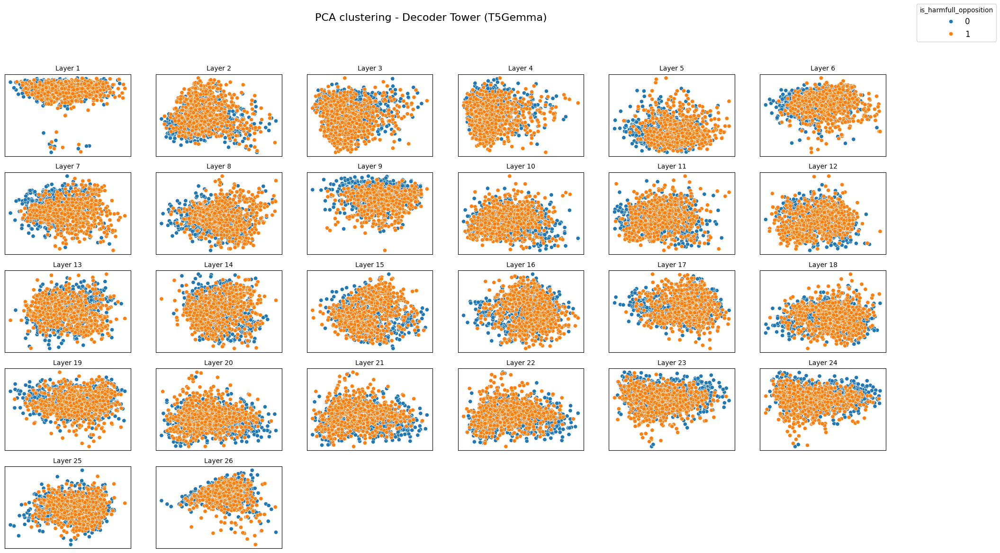

In [23]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="last-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="last-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Decoder Tower (T5Gemma)')

Median normalize used
Layer 1/27, CCS accuracy: 0.532
Median normalize used
Layer 2/27, CCS accuracy: 0.52
Median normalize used
Layer 3/27, CCS accuracy: 0.532
Median normalize used
Layer 4/27, CCS accuracy: 0.56
Median normalize used
Layer 5/27, CCS accuracy: 0.584
Median normalize used
Layer 6/27, CCS accuracy: 0.54
Median normalize used
Layer 7/27, CCS accuracy: 0.612
Median normalize used
Layer 8/27, CCS accuracy: 0.556
Median normalize used
Layer 9/27, CCS accuracy: 0.572
Median normalize used
Layer 10/27, CCS accuracy: 0.5760000000000001
Median normalize used
Layer 11/27, CCS accuracy: 0.56
Median normalize used
Layer 12/27, CCS accuracy: 0.56
Median normalize used
Layer 13/27, CCS accuracy: 0.572
Median normalize used
Layer 14/27, CCS accuracy: 0.556
Median normalize used
Layer 15/27, CCS accuracy: 0.56
Median normalize used
Layer 16/27, CCS accuracy: 0.556
Median normalize used
Layer 17/27, CCS accuracy: 0.564
Median normalize used
Layer 18/27, CCS accuracy: 0.5840000000000001

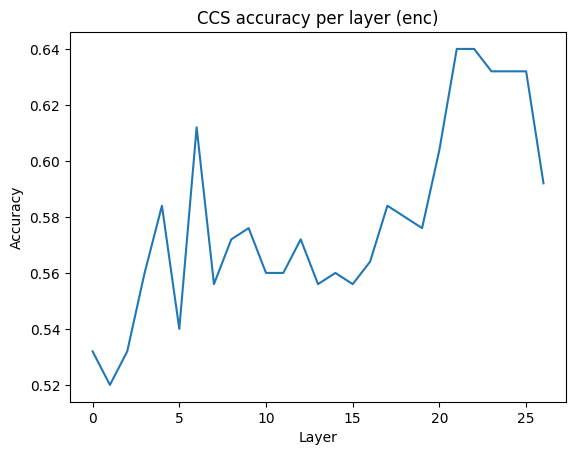

► Best enc layer = 21  (acc=0.640)


In [ ]:
import random, numpy as np, torch, pickle, matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from ccs import train_ccs_on_hidden_states
import sys
import os

# Add the code directory directly to Python path
code_dir = '/Users/elenaericheva/ericheva_git/ccs_aisf/code'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

print(f"Added {code_dir} to Python path")

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.backends.cudnn.deterministic, torch.backends.cudnn.benchmark = True, False

def run_ccs(X_pos_norm, X_neg_norm, *, tower_tag):
    # Train / test split once per tower
    idx              = np.arange(len(X_pos_norm))
    train_idx, test_idx = train_test_split(idx, test_size=0.2,
                                           random_state=71, shuffle=True)

    # CCS
    ccs_layers = train_ccs_on_hidden_states(X_pos_norm,
                                            X_neg_norm,
                                            hate_data['is_harmfull_opposition'],
                                            train_idx, test_idx,
                                            normalizing='median')

    # save
    with open(f'ccs_{YOUR_NAME}_{tower_tag}_not_results.pkl', 'wb') as f:
        pickle.dump(ccs_layers, f)

    # Accuracy curve
    acc = [layer_data['accuracy'] for layer_idx, layer_data in ccs_layers.items()]
    plt.figure(); plt.plot(acc); plt.title(f'CCS accuracy per layer ({tower_tag})')
    plt.xlabel('Layer'); plt.ylabel('Accuracy'); plt.show()

    # Best layer
    best_layer = int(np.argmax(acc))
    print(f'► Best {tower_tag} layer = {best_layer}  (acc={acc[best_layer]:.3f})')
    return best_layer

# best_enc_layer = run_ccs(X_pos_enc, X_neg_enc, tower_tag='enc')


In [ ]:
YOUR_NAME = "t5gemma-2b-2b-ul2"
hate_data = pd.read_csv('../data/raw/total_hate3.0.csv', index_col=0)
X_pos_enc = np.load(f"{YOUR_NAME}_enc_pos_mean_not.npz")['arr_0']
X_neg_enc = np.load(f"{YOUR_NAME}_enc_neg_mean_not.npz")['arr_0']
best_enc_layer = run_ccs(X_pos_enc, X_neg_enc, tower_tag='enc')

Median normalize used
Layer 1/27, CCS accuracy: 0.516
Median normalize used
Layer 2/27, CCS accuracy: 0.62
Median normalize used
Layer 3/27, CCS accuracy: 0.636
Median normalize used
Layer 4/27, CCS accuracy: 0.504
Median normalize used
Layer 5/27, CCS accuracy: 0.508
Median normalize used
Layer 6/27, CCS accuracy: 0.708
Median normalize used
Layer 7/27, CCS accuracy: 0.6759999999999999
Median normalize used
Layer 8/27, CCS accuracy: 0.6639999999999999
Median normalize used
Layer 9/27, CCS accuracy: 0.5680000000000001
Median normalize used
Layer 10/27, CCS accuracy: 0.708
Median normalize used
Layer 11/27, CCS accuracy: 0.64
Median normalize used
Layer 12/27, CCS accuracy: 0.7
Median normalize used
Layer 13/27, CCS accuracy: 0.604
Median normalize used
Layer 14/27, CCS accuracy: 0.5880000000000001
Median normalize used
Layer 15/27, CCS accuracy: 0.612
Median normalize used
Layer 16/27, CCS accuracy: 0.536
Median normalize used
Layer 17/27, CCS accuracy: 0.96
Median normalize used
Layer

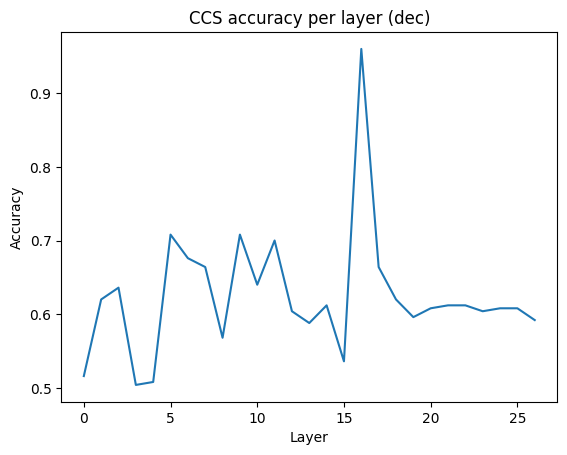

► Best dec layer = 16  (acc=0.960)


In [ ]:
YOUR_NAME = "t5gemma-2b-2b-ul2"
hate_data = pd.read_csv('../data/raw/total_hate3.0.csv', index_col=0)
X_pos_dec = np.load(f"{YOUR_NAME}_dec_pos_last-token_not.npz")['arr_0']
X_neg_dec = np.load(f"{YOUR_NAME}_dec_neg_last-token_not.npz")['arr_0']
best_dec_layer = run_ccs(X_pos_dec, X_neg_dec, tower_tag='dec')


In [ ]:
from ccs import CCS
import pandas as pd, numpy as np, pickle
from sklearn.model_selection import train_test_split

def single_layer_ccs(X_pos_norm, X_neg_norm, best_layer, *, tower_tag):
    # Slice out the chosen layer
    X_pos_layer = pd.DataFrame(X_pos_norm[:, best_layer])
    X_neg_layer = pd.DataFrame(X_neg_norm[:, best_layer])

    idx = np.arange(len(X_pos_norm))
    train_idx, test_idx = train_test_split(idx, test_size=0.2,
                                           random_state=71, shuffle=True)

    # Train/test split
    X_pos_train = X_pos_layer.loc[train_idx].values.astype(np.float32)
    X_pos_test  = X_pos_layer.loc[test_idx].values.astype(np.float32)
    X_neg_train = X_neg_layer.loc[train_idx].values.astype(np.float32)
    X_neg_test  = X_neg_layer.loc[test_idx].values.astype(np.float32)

    y_train = hate_data['is_harmfull_opposition'][train_idx]
    y_test  = hate_data['is_harmfull_opposition'][test_idx]

    # Median normalise in‑place
    X_pos_train -= np.median(X_pos_train); X_pos_test -= np.median(X_pos_train)
    X_neg_train -= np.median(X_neg_train); X_neg_test -= np.median(X_neg_train)

    # CCS without labels (NEG first, then POS)
    ccs = CCS(X_neg_train, X_pos_train, y_train.values,
              var_normalize=False, lambda_classification=0,
              predict_normalize=False)
    ccs.repeated_train()

    acc = ccs.get_acc(X_neg_test, X_pos_test, y_test.values)
    print(f'CCS accuracy ({tower_tag}, layer {best_layer}) = {acc:.3f}')

    with open(f'ccs_{YOUR_NAME}_{tower_tag}_not_l{best_layer}.pkl', 'wb') as f:
        pickle.dump(ccs, f)

# Run for both towers
single_layer_ccs(X_pos_enc, X_neg_enc, best_enc_layer, tower_tag='enc')
single_layer_ccs(X_pos_dec, X_neg_dec, best_dec_layer, tower_tag='dec')


CCS accuracy (enc, layer 21) = 0.516
CCS accuracy (dec, layer 16) = 0.892


# TTT


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: first-token): 100%|██████████| 1250/1250 [09:22<00:00,  2.22it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=468.000, min=-980.000, std=3.911


Extracting embeddings (strategy: first-token): 100%|██████████| 1250/1250 [09:32<00:00,  2.18it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=246.000, min=-932.000, std=3.886

► Plotting PCA for *encoder* embeddings …


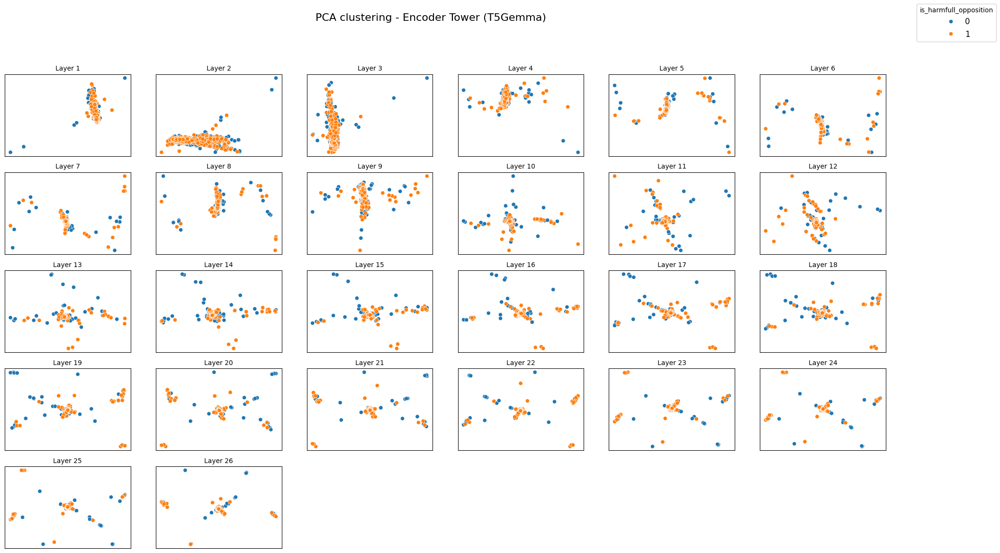

In [ ]:
import torch
import pandas as pd
import numpy as np
from extract_fixed_t5gemma import vectorize_df
from format_results_fixed import plot_pca_or_tsne_layerwise


# ──────────────────────────────────────────────────────────────────────────────
# 2. Load your datasets
# ──────────────────────────────────────────────────────────────────────────────

hate_data           = pd.read_csv('../data/raw/total_hate3.0.csv', index_col=0)
hate_total_yes_data = pd.read_csv('../data/yes_no/hate_total3.0_yes.csv', index_col=0)
hate_total_no_data  = pd.read_csv('../data/yes_no/hate_total3.0_no.csv',  index_col=0)

hate_total_yes_data['statement'] = hate_total_yes_data['statement'].apply(
                                    lambda x: x.replace('not', 'ttt').replace('Not', 'ttt'))
hate_total_no_data['statement'] = hate_total_no_data['statement'].apply(
                                        lambda x: x.replace('not', 'ttt').replace('Not', 'ttt'))

# ──────────────────────────────────────────────────────────────────────────────
# 3. Helper to run vectorise‑>save‑>normalise in one go
# ──────────────────────────────────────────────────────────────────────────────
def embed_and_normalise(df_text, tower_tag, strategy, use_decoder, model, tokenizer):
    """Returns L2‑normalised (n_samples, n_layers, dim) GPU tensor"""
    # CHANGED: Use GPU device and return GPU tensor
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    X = vectorize_df(df_text,
                     model, tokenizer,
                     strategy=strategy, 
                     model_type="encoder-decoder",
                     use_decoder=use_decoder,
                     get_all_hs=True,
                     device=device)  # CHANGED: Use GPU

    # CHANGED: Save CPU version but keep GPU tensor for return
    np.savez_compressed(f"{YOUR_NAME}_{tower_tag}_{strategy}_ttt.npz", X.cpu().numpy())

    # CHANGED: L2-normalize on GPU
    X_flat = X.view(-1, X.shape[-1])
    X_norm = torch.nn.functional.normalize(X_flat, p=2, dim=1).view(X.shape)

    # CHANGED: Save normalized version
    # np.savez_compressed(f"{YOUR_NAME}_{tower_tag}_{strategy}_norm.npz", X_norm.cpu().numpy())
    return X_norm  # CHANGED: Return GPU tensor

# ──────────────────────────────────────────────────────────────────────────────
# 4‑A. Encoder tower  (mean token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="enc_pos",
                                strategy="first-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="enc_neg",
                                strategy="first-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_enc = X_pos_enc.cpu().numpy()
X_neg_enc = X_neg_enc.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_enc,
                           X_neg_enc,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')







► Extracting *encoder* embeddings …


Extracting embeddings (strategy: last-token): 100%|██████████| 1250/1250 [09:23<00:00,  2.22it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=96.000, min=-245.000, std=4.038


Extracting embeddings (strategy: last-token): 100%|██████████| 1250/1250 [10:54<00:00,  1.91it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=98.000, min=-209.000, std=3.849

► Plotting PCA for *encoder* embeddings …


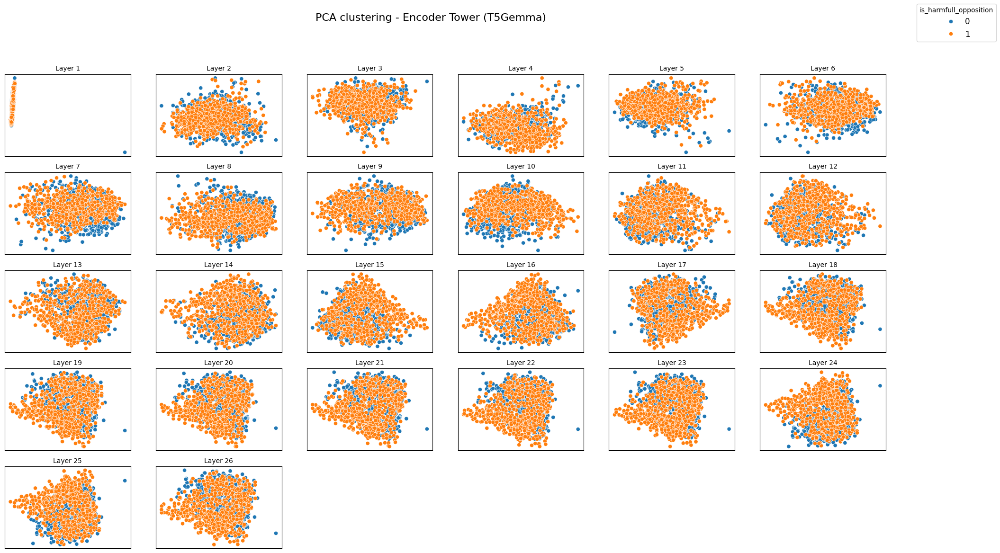

In [28]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑A. Encoder tower  (mean token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="enc_pos",
                                strategy="last-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="enc_neg",
                                strategy="last-token",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_enc = X_pos_enc.cpu().numpy()
X_neg_enc = X_neg_enc.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_enc,
                           X_neg_enc,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: mean): 100%|██████████| 1250/1250 [09:36<00:00,  2.17it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=232.016, min=-609.500, std=3.522


Extracting embeddings (strategy: mean): 100%|██████████| 1250/1250 [09:54<00:00,  2.10it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=232.901, min=-604.417, std=3.481

► Plotting PCA for *encoder* embeddings …


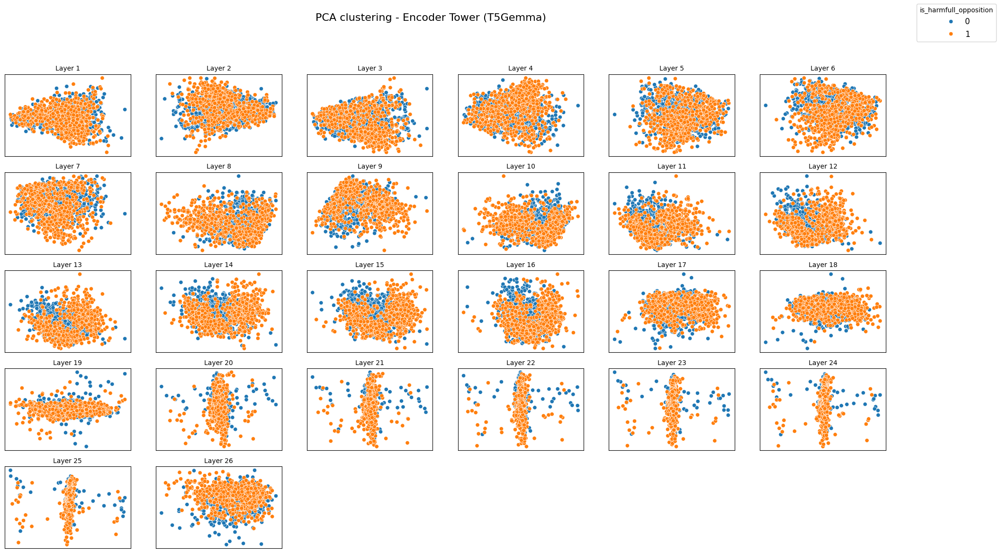

In [29]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑A. Encoder tower  (mean token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_enc = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="enc_pos",
                                strategy="mean",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

X_neg_enc = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="enc_neg",
                                strategy="mean",
                                use_decoder=False,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_enc = X_pos_enc.cpu().numpy()
X_neg_enc = X_neg_enc.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_enc,
                           X_neg_enc,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Encoder Tower (T5Gemma)')


► Extracting *decoder* embeddings …


Extracting embeddings (strategy: first-token): 100%|██████████| 1250/1250 [17:27<00:00,  1.19it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=952.000, min=-410.000, std=16.376


Extracting embeddings (strategy: first-token): 100%|██████████| 1250/1250 [16:00<00:00,  1.30it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=952.000, min=-408.000, std=16.362

► Plotting PCA for *encoder* embeddings …


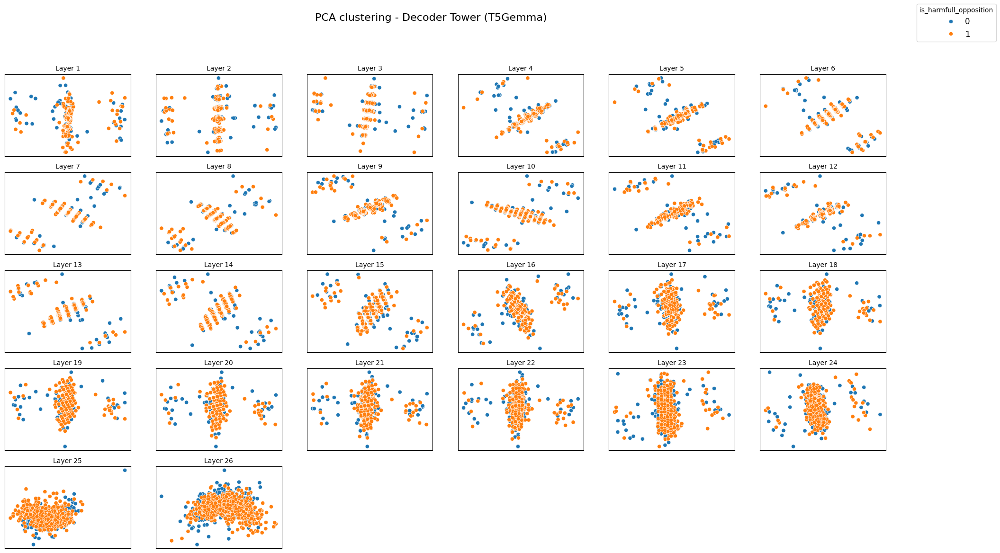

In [30]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *decoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="first-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="first-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Decoder Tower (T5Gemma)')


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: mean): 100%|██████████| 1250/1250 [18:37<00:00,  1.12it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=175.000, min=-113.271, std=2.634


Extracting embeddings (strategy: mean): 100%|██████████| 1250/1250 [17:55<00:00,  1.16it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=170.438, min=-114.208, std=2.619

► Plotting PCA for *encoder* embeddings …


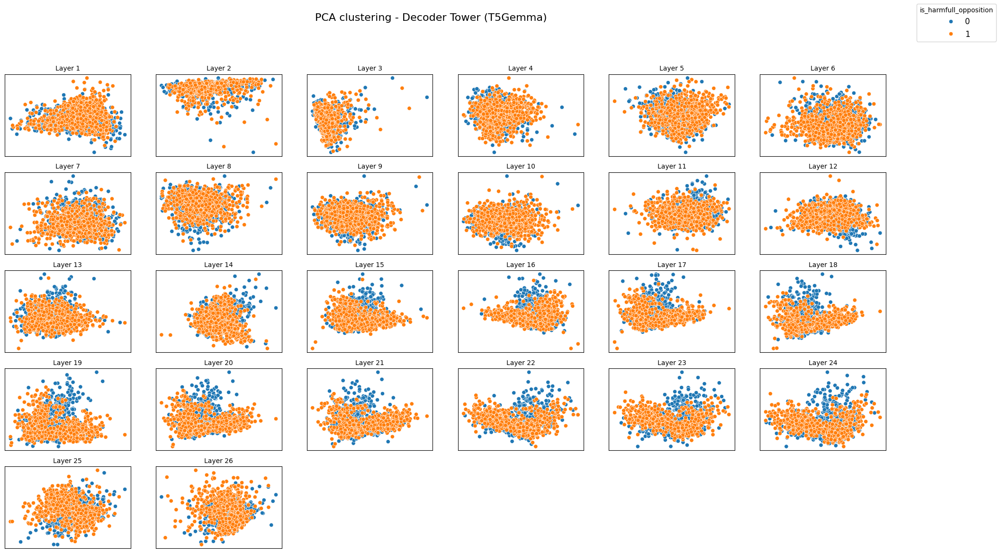

In [31]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="mean",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="mean",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Decoder Tower (T5Gemma)')

In [33]:
import numpy as np
import torch
from tqdm import tqdm


def get_llm_type(model_cfg) -> str:
    """
    Determine the model type based on configuration
    """
    if model_cfg.config.is_encoder_decoder:
        return "encoder-decoder"

    model_type = model_cfg.config.model_type.lower()
    if model_type in [
        "bert",
        "roberta",
        "distilbert",
        "albert",
        "deberta",
        "deberta-v2",
    ]:
        return "encoder"
    elif model_type in [
        "gpt2",
        "gpt",
        "gptj",
        "gpt_neo",
        "gpt_neox",
        "llama",
        "bloom",
        "opt",
        "falcon",
        "gemma",
    ]:
        return "decoder"

    return "unknown"


def extract_representation(
    model,
    tokenizer,
    text,
    layer_index=None,
    get_all_hs=False,
    strategy="last-token",
    model_type=None,
    use_decoder=False,
    device=None,
    token_number=None,
):
    """
    FIXED: Extracts the vector representation from the given model layer or all model layers.
    MAJOR CHANGE: Proper encoder-decoder handling with meaningful decoder input for different strategies.

    Args:
        - model: HuggingFace model
        - tokenizer: model tokenizer
        - text: input string
        - layer_index: layer number (as default middle layer)
        - strategy: 'first-token' (for encoders), 'last-token' (for decoders), 'mean', or 'custom'
        - model_type: "encoder", "encoder-decoder", "decoder"
        - use_decoder: if True use decoder hidden states (for encoder-decoder models)
        - device: computation device
        - token_number: specific token position for 'custom' strategy

    Return:
        - torch.Tensor (n_layers, dim) if get_all_hs=True, else (dim,) - kept on GPU
    """
    # Enhanced device handling - prefer GPU
    if device is None:
        if torch.cuda.is_available():
            device = torch.device("cuda")
        elif torch.backends.mps.is_available():
            device = torch.device("mps")
        elif hasattr(model, "device"):
            device = model.device
        else:
            device = torch.device("cpu")
    else:
        device = torch.device(device)

    # Enhanced model type detection
    if model_type is None:
        model_type = get_llm_type(model)

    # MAJOR CHANGE: Proper encoder-decoder handling for T5GemmaForConditionalGeneration
    if model_type == "encoder-decoder":
        # Tokenize input for encoder
        enc_inputs = tokenizer(
            text, return_tensors="pt", padding=True, truncation=True, max_length=512
        ).to(device)
        
        # Check for empty inputs
        if enc_inputs["input_ids"].shape[1] == 0:
            raise ValueError("Empty input tensor detected - check tokenization")

        if use_decoder:
            # CHANGED: Create decoder input sequence for multiple token positions
            # The decoder receives encoder outputs internally, we just need decoder input tokens
            
            # Get appropriate decoder start token
            if hasattr(tokenizer, 'decoder_start_token_id') and tokenizer.decoder_start_token_id is not None:
                decoder_start_token_id = tokenizer.decoder_start_token_id
            elif hasattr(tokenizer, 'bos_token_id') and tokenizer.bos_token_id is not None:
                decoder_start_token_id = tokenizer.bos_token_id
            elif hasattr(tokenizer, 'pad_token_id') and tokenizer.pad_token_id is not None:
                decoder_start_token_id = tokenizer.pad_token_id
            else:
                decoder_start_token_id = 0  # fallback
            
            batch_size = enc_inputs["input_ids"].shape[0]
            encoder_length = enc_inputs["input_ids"].shape[1]
            
            # MAJOR FIX: Create decoder input with multiple tokens so different strategies work
            # Use the full encoder input as decoder input (this is common practice)
            # The encoder-decoder attention will handle the actual encoder output connection
            decoder_input_ids = torch.cat([
                torch.full((batch_size, 1), decoder_start_token_id, dtype=torch.long, device=device),
                enc_inputs["input_ids"][:, :-1]  # Shift right: remove last token, prepend start token
            ], dim=1)
            
            # Create proper attention mask for decoder input
            decoder_attention_mask = torch.cat([
                torch.ones((batch_size, 1), device=device),  # Start token is always attended
                enc_inputs.get("attention_mask", torch.ones_like(enc_inputs["input_ids"]))[:, :-1]
            ], dim=1)
            
            with torch.no_grad():
                # CHANGED: Normal encoder-decoder forward pass
                # Encoder processes input, decoder receives encoder outputs + decoder input
                outputs = model(
                    input_ids=enc_inputs["input_ids"],
                    attention_mask=enc_inputs.get("attention_mask", None),
                    decoder_input_ids=decoder_input_ids,
                    decoder_attention_mask=decoder_attention_mask,
                    output_hidden_states=True
                )
                
                # Use decoder hidden states - now has multiple positions for different strategies
                hs_tuple = outputs.decoder_hidden_states
                attention_mask = decoder_attention_mask  # Use decoder attention mask for strategies
                
        else:
            # CHANGED: For encoder extraction, use encoder_hidden_states from full forward pass
            with torch.no_grad():
                # Use a minimal decoder input to get encoder hidden states
                dummy_decoder_input = torch.full(
                    (enc_inputs["input_ids"].shape[0], 1), 
                    tokenizer.pad_token_id if tokenizer.pad_token_id is not None else 0,
                    dtype=torch.long, 
                    device=device
                )
                
                outputs = model(
                    input_ids=enc_inputs["input_ids"],
                    attention_mask=enc_inputs.get("attention_mask", None),
                    decoder_input_ids=dummy_decoder_input,
                    output_hidden_states=True
                )
                
                hs_tuple = outputs.encoder_hidden_states
                attention_mask = enc_inputs.get("attention_mask", None)

    # Encoder only OR Decoder only models
    else:
        inputs = tokenizer(
            text, return_tensors="pt", padding=True, truncation=True, max_length=512
        ).to(device)
        
        attention_mask = inputs.get("attention_mask", None)
        
        # Check for empty inputs
        if inputs["input_ids"].shape[1] == 0:
            raise ValueError("Empty input tensor detected - check tokenization")
            
        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            hs_tuple = outputs["hidden_states"]

    # Enhanced extraction logic with proper handling for all cases, keep on GPU
    if get_all_hs:
        reps = []
        for layer_idx, layer_h in enumerate(hs_tuple):
            # Keep on GPU and convert to float32
            layer_h = layer_h.float()

            # Check for empty tensors
            if layer_h.shape[1] == 0:
                print(f"Warning: Empty hidden states at layer {layer_idx}, skipping...")
                continue

            # Handle different extraction strategies properly
            if strategy == "first-token":
                # Use first token (good for encoder models)
                extracted = layer_h[:, 0, :].squeeze(0)

            elif strategy == "last-token":
                # Use attention mask to find actual last token, not padding
                if attention_mask is not None and attention_mask.shape[1] > 0:
                    # Find last non-padding token for each sequence
                    # FIXED: Ensure indices are long integers
                    last_token_indices = (attention_mask.sum(dim=1) - 1).long()
                    batch_size = layer_h.shape[0]

                    if batch_size == 1:
                        # Single sequence case
                        last_hidden = layer_h[0, last_token_indices[0], :]
                        extracted = last_hidden
                    else:
                        # Multiple sequences case
                        last_hidden = layer_h[
                            torch.arange(batch_size, device=device, dtype=torch.long), last_token_indices
                        ]
                        extracted = last_hidden.squeeze()
                else:
                    # Fallback to simple last token if no attention mask
                    extracted = layer_h[:, -1, :].squeeze(0)

            elif strategy == "mean":
                # Use attention mask for proper mean pooling (exclude padding), keep on GPU
                if attention_mask is not None and attention_mask.shape[1] > 0:
                    # Expand mask to match hidden states dimensions
                    expanded_mask = (
                        attention_mask.unsqueeze(-1).expand(layer_h.size()).float()
                    )
                    # Mask out padding tokens
                    masked_hidden = layer_h * expanded_mask
                    # Sum and divide by actual sequence length
                    summed = torch.sum(masked_hidden, dim=1)
                    lengths = torch.sum(expanded_mask, dim=1)
                    # Avoid division by zero
                    lengths = torch.clamp(lengths, min=1.0)
                    mean_hidden = summed / lengths
                    extracted = mean_hidden.squeeze(0)
                else:
                    # Fallback to simple mean if no attention mask
                    extracted = layer_h.mean(dim=1).squeeze(0)

            elif strategy == "custom":
                # Add bounds checking for custom token number
                if token_number is not None:
                    seq_len = layer_h.shape[1]
                    if token_number < seq_len:
                        extracted = layer_h[:, token_number, :].squeeze(0)
                    else:
                        # Fallback to last available token if token_number is out of bounds
                        extracted = layer_h[:, -1, :].squeeze(0)
                        print(
                            f"Warning: token_number {token_number} >= seq_len {seq_len}, using last token"
                        )
                else:
                    raise ValueError(
                        "token_number must be specified for 'custom' strategy"
                    )

            else:
                raise ValueError(
                    "strategy must be 'mean', 'last-token', 'first-token', or 'custom'"
                )

            # Keep as GPU tensor, ensure float32 and handle any remaining numerical issues
            extracted = extracted.float()

            # Replace any inf/nan values with zeros on GPU
            extracted = torch.where(torch.isfinite(extracted), extracted, torch.zeros_like(extracted))

            reps.append(extracted)

        # Return as GPU tensor stack
        if len(reps) == 0:
            raise ValueError("No valid hidden states extracted")
            
        result = torch.stack(reps).float()

        # Final check for extreme values and clip if necessary, on GPU
        max_abs_val = torch.max(torch.abs(result))
        if max_abs_val > 1000:
            # print(
            #     f"Warning: Extreme values detected (max: {max_abs_val:.2f}), applying clipping..."
            # )
            clip_value = torch.quantile(torch.abs(result.flatten()), 0.995)
            result = torch.clamp(result, -clip_value, clip_value)

        return result

    else:
        # Single layer extraction
        if layer_index is None:
            layer_index = len(hs_tuple) // 2  # middle layer as default

        # Add bounds checking for layer_index
        if layer_index >= len(hs_tuple):
            layer_index = len(hs_tuple) - 1
            print(f"Warning: layer_index out of bounds, using layer {layer_index}")

        hs = hs_tuple[layer_index][0].float()  # Convert to float32

        # Check for empty hidden states
        if hs.shape[0] == 0:
            raise ValueError("Empty hidden states detected")

        # Apply same enhanced logic for single layer extraction
        if strategy == "mean":
            if attention_mask is not None and attention_mask.shape[1] > 0:
                expanded_mask = attention_mask.unsqueeze(-1).expand(hs.size()).float()
                masked_hidden = hs * expanded_mask
                summed = torch.sum(masked_hidden, dim=0)
                length = torch.sum(expanded_mask, dim=0)
                length = torch.clamp(length, min=1.0)  # Avoid division by zero
                result = (summed / length).float()
            else:
                result = hs.mean(dim=0).float()

        elif strategy == "first-token":
            result = hs[0].float()

        elif strategy == "last-token":
            if attention_mask is not None and attention_mask.shape[1] > 0:
                # FIXED: Ensure indices are long integers
                last_token_idx = (attention_mask.sum(dim=1) - 1).long()
                result = hs[last_token_idx[0]].float()
            else:
                result = hs[-1].float()

        elif strategy == "custom":
            if token_number is not None:
                seq_len = hs.shape[0]
                if token_number < seq_len:
                    result = hs[token_number].float()
                else:
                    result = hs[-1].float()
                    print(
                        f"Warning: token_number {token_number} >= seq_len {seq_len}, using last token"
                    )
            else:
                raise ValueError("token_number must be specified for 'custom' strategy")
        else:
            raise ValueError(
                "strategy must be 'mean', 'last-token', 'first-token', or 'custom'"
            )

        # Clean up result on GPU
        result = torch.where(torch.isfinite(result), result, torch.zeros_like(result))
        return result


def vectorize_df(
    df_text,
    model,
    tokenizer,
    layer_index=None,
    strategy="last-token",
    model_type=None,
    use_decoder=False,
    get_all_hs=False,
    device=None,
    token_number=None,
):
    """
    Converts the df_text to an embedding matrix keeping everything on GPU
    Enhanced with better error handling and progress reporting.

    Args:
        df_text: list or pandas Series with text data
        model: HuggingFace model
        tokenizer: tokenizer
        layer_index: layer index (int or None - middle layer as default)
        strategy: 'first-token', 'last-token', 'mean', or 'custom'
        model_type: str ('encoder', 'encoder-decoder', 'decoder')
        use_decoder: use decoder hidden states for encoder-decoder models
        get_all_hs: extract all hidden states layers
        device: computation device
        token_number: specific token position for 'custom' strategy

    Return:
        torch.Tensor (n_samples, n_layers, hidden_dim) if get_all_hs=True - kept on GPU
        torch.Tensor (n_samples, hidden_dim) if get_all_hs=False - kept on GPU
    """
    # Prefer GPU device
    if device is None:
        if torch.cuda.is_available():
            device = torch.device("cuda")
        elif torch.backends.mps.is_available():
            device = torch.device("mps")
        elif hasattr(model, "device"):
            device = model.device
        else:
            device = torch.device("cpu")
    else:
        device = torch.device(device)
    
    embeddings = []
    failed_extractions = 0

    # Better progress bar with more information
    for idx in tqdm(
        range(len(df_text)), desc=f"Extracting embeddings (strategy: {strategy})"
    ):
        # Handle different input types (list, pandas Series, etc.)
        if hasattr(df_text, "iloc"):
            text = df_text.iloc[idx]
        else:
            text = df_text[idx]

        # Skip empty or None texts
        if text is None or (isinstance(text, str) and len(text.strip()) == 0):
            print(f"Warning: Empty text at index {idx}, skipping...")
            failed_extractions += 1
            continue

        # Wrapped in explicit error checking instead of try-except
        text_valid = isinstance(text, str) and len(text.strip()) > 0
        if not text_valid:
            print(f"Warning: Invalid text at index {idx}, skipping...")
            failed_extractions += 1
            continue

        vec = extract_representation(
            model=model,
            tokenizer=tokenizer,
            text=text,
            layer_index=layer_index,
            strategy=strategy,
            model_type=model_type,
            use_decoder=use_decoder,
            get_all_hs=get_all_hs,
            device=device,
            token_number=token_number,
        )
        embeddings.append(vec)

    if failed_extractions > 0:
        print(
            f"Warning: {failed_extractions} extractions failed and were skipped"
        )

    # Better error handling for empty results
    if len(embeddings) == 0:
        raise ValueError("No successful extractions - all texts failed to process")

    # Stack tensors on GPU instead of converting to numpy
    first_shape = embeddings[0].shape
    all_same_shape = all(emb.shape == first_shape for emb in embeddings)
    
    if not all_same_shape:
        print("Warning: Inconsistent embedding shapes detected, attempting to fix...")
        # Find max dimensions
        if len(first_shape) == 1:
            max_dim = max(emb.shape[0] for emb in embeddings)
            padded_embeddings = []
            for emb in embeddings:
                if emb.shape[0] < max_dim:
                    padding = torch.zeros(max_dim - emb.shape[0], device=device, dtype=emb.dtype)
                    padded = torch.cat([emb, padding], dim=0)
                    padded_embeddings.append(padded)
                else:
                    padded_embeddings.append(emb)
            embeddings = padded_embeddings
        elif len(first_shape) == 2:
            max_dim0 = max(emb.shape[0] for emb in embeddings)
            max_dim1 = max(emb.shape[1] for emb in embeddings)
            padded_embeddings = []
            for emb in embeddings:
                if emb.shape[0] < max_dim0 or emb.shape[1] < max_dim1:
                    padded = torch.zeros(max_dim0, max_dim1, device=device, dtype=emb.dtype)
                    padded[:emb.shape[0], :emb.shape[1]] = emb
                    padded_embeddings.append(padded)
                else:
                    padded_embeddings.append(emb)
            embeddings = padded_embeddings

    # Stack as GPU tensor
    result = torch.stack(embeddings).float()

    # Final validation and cleanup on GPU
    print(f"Extraction completed: shape={result.shape}, dtype={result.dtype}, device={result.device}")
    result_max = torch.max(result)
    result_min = torch.min(result)
    result_std = torch.std(result)
    print(f"Stats: max={result_max:.3f}, min={result_min:.3f}, std={result_std:.3f}")

    # Final check for extreme values on GPU
    max_abs_val = torch.max(torch.abs(result))
    if max_abs_val > 1000:
        # print("Warning: Extreme values detected in final result, applying global clipping...")
        clip_value = torch.quantile(torch.abs(result.flatten()), 0.999)
        result = torch.clamp(result, -clip_value, clip_value)
        print(f"Applied clipping at ±{clip_value:.2f}")

    # Final check for inf/nan on GPU
    inf_count = torch.sum(torch.isinf(result))
    nan_count = torch.sum(torch.isnan(result))
    if inf_count > 0 or nan_count > 0:
        print(f"Warning: Found {inf_count} inf and {nan_count} nan values, replacing with zeros...")
        result = torch.where(torch.isfinite(result), result, torch.zeros_like(result))

    return result


# Additional utility functions for model-specific configurations
def get_recommended_strategy(model_type):
    """
    Get recommended extraction strategy based on model type
    """
    if model_type == "encoder":
        return "first-token"
    elif model_type == "decoder":
        return "last-token"
    elif model_type == "encoder-decoder":
        return "mean"  # or "last-token" if using decoder
    else:
        return "mean"  # safe default


def validate_extraction_params(model, tokenizer, model_type, strategy):
    """
    Validate that extraction parameters make sense for the given model
    """
    detected_type = get_llm_type(model)

    if model_type != detected_type:
        print(
            f"Warning: model_type '{model_type}' doesn't match detected type '{detected_type}'"
        )

    recommended_strategy = get_recommended_strategy(detected_type)
    if strategy != recommended_strategy:
        print(
            f"Info: Using strategy '{strategy}', but '{recommended_strategy}' is recommended for {detected_type} models"
        )


# Example usage configurations for different models
def get_deberta_config():
    """Configuration for DeBERTa model"""
    return {
        "strategy": "first-token",
        "model_type": "encoder",
        "use_decoder": False,
        "get_all_hs": True,
    }


def get_gemma_config():
    """Configuration for Gemma model"""
    return {
        "strategy": "last-token",
        "model_type": "decoder",
        "use_decoder": False,
        "get_all_hs": True,
    }


def get_t5_config(use_decoder=True):
    """Configuration for T5 model"""
    return {
        "strategy": "last-token" if use_decoder else "first-token",
        "model_type": "encoder-decoder",
        "use_decoder": use_decoder,
        "get_all_hs": True,
    }


► Extracting *encoder* embeddings …


Extracting embeddings (strategy: last-token): 100%|██████████| 1250/1250 [21:11<00:00,  1.02s/it]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=118.500, min=-141.000, std=3.152


Extracting embeddings (strategy: last-token): 100%|██████████| 1250/1250 [19:29<00:00,  1.07it/s]


Extraction completed: shape=torch.Size([1250, 27, 2304]), dtype=torch.float32, device=cpu
Stats: max=122.000, min=-139.000, std=3.123

► Plotting PCA for *encoder* embeddings …


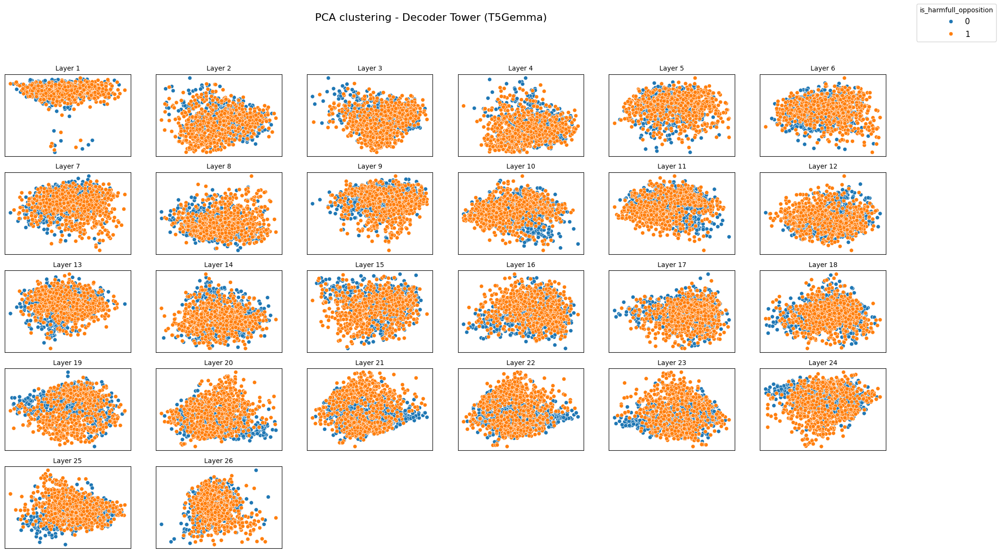

In [34]:
# ──────────────────────────────────────────────────────────────────────────────
# 4‑B. Decoder tower  (last token works best)
# ──────────────────────────────────────────────────────────────────────────────
print("\n► Extracting *encoder* embeddings …")
X_pos_dec = embed_and_normalise(hate_total_yes_data['statement'],
                                tower_tag="dec_pos",
                                strategy="last-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

X_neg_dec = embed_and_normalise(hate_total_no_data['statement'],
                                tower_tag="dec_neg",
                                strategy="last-token",
                                use_decoder=True,
                                model=model,
                                tokenizer=tokenizer)

# CHANGED: Convert GPU tensors to CPU numpy arrays for plotting
X_pos_dec = X_pos_dec.cpu().numpy()
X_neg_dec = X_neg_dec.cpu().numpy()

print("\n► Plotting PCA for *encoder* embeddings …")
plot_pca_or_tsne_layerwise(X_pos_dec,
                           X_neg_dec,
                           hate_data['is_harmfull_opposition'],
                           standardize=False, n_components=5,
                           components=[0, 1], mode='pca',
                           plot_title='PCA clustering - Decoder Tower (T5Gemma)')

In [1]:
# Add the code directory directly to Python path
code_dir = '/Users/elenaericheva/ericheva_git/ccs_aisf/code'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

print(f"Added {code_dir} to Python path")

import random, numpy as np, torch, pickle, matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from ccs import train_ccs_on_hidden_states
import sys
import os



SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.backends.cudnn.deterministic, torch.backends.cudnn.benchmark = True, False

def run_ccs(X_pos_norm, X_neg_norm, *, tower_tag):
    # Train / test split once per tower
    idx              = np.arange(len(X_pos_norm))
    train_idx, test_idx = train_test_split(idx, test_size=0.2,
                                           random_state=71, shuffle=True)

    # CCS
    ccs_layers = train_ccs_on_hidden_states(X_pos_norm,
                                            X_neg_norm,
                                            hate_data['is_harmfull_opposition'],
                                            train_idx, test_idx,
                                            normalizing='median')

    # save
    with open(f'ccs_{YOUR_NAME}_{tower_tag}_ttt_results.pkl', 'wb') as f:
        pickle.dump(ccs_layers, f)

    # Accuracy curve
    acc = [layer_data['accuracy'] for layer_idx, layer_data in ccs_layers.items()]
    plt.figure(); plt.plot(acc); plt.title(f'CCS accuracy per layer ({tower_tag})')
    plt.xlabel('Layer'); plt.ylabel('Accuracy'); plt.show()

    # Best layer
    best_layer = int(np.argmax(acc))
    print(f'► Best {tower_tag} layer = {best_layer}  (acc={acc[best_layer]:.3f})')
    return best_layer

# best_enc_layer = run_ccs(X_pos_enc, X_neg_enc, tower_tag='enc')


ModuleNotFoundError: No module named 'ccs'

Median normalize used
Layer 1/27, CCS accuracy: 0.516
Median normalize used
Layer 2/27, CCS accuracy: 0.5
Median normalize used
Layer 3/27, CCS accuracy: 0.532
Median normalize used
Layer 4/27, CCS accuracy: 0.56
Median normalize used
Layer 5/27, CCS accuracy: 0.58
Median normalize used
Layer 6/27, CCS accuracy: 0.556
Median normalize used
Layer 7/27, CCS accuracy: 0.5640000000000001
Median normalize used
Layer 8/27, CCS accuracy: 0.54
Median normalize used
Layer 9/27, CCS accuracy: 0.56
Median normalize used
Layer 10/27, CCS accuracy: 0.552
Median normalize used
Layer 11/27, CCS accuracy: 0.5640000000000001
Median normalize used
Layer 12/27, CCS accuracy: 0.536
Median normalize used
Layer 13/27, CCS accuracy: 0.564
Median normalize used
Layer 14/27, CCS accuracy: 0.552
Median normalize used
Layer 15/27, CCS accuracy: 0.556
Median normalize used
Layer 16/27, CCS accuracy: 0.572
Median normalize used
Layer 17/27, CCS accuracy: 0.5680000000000001
Median normalize used
Layer 18/27, CCS ac

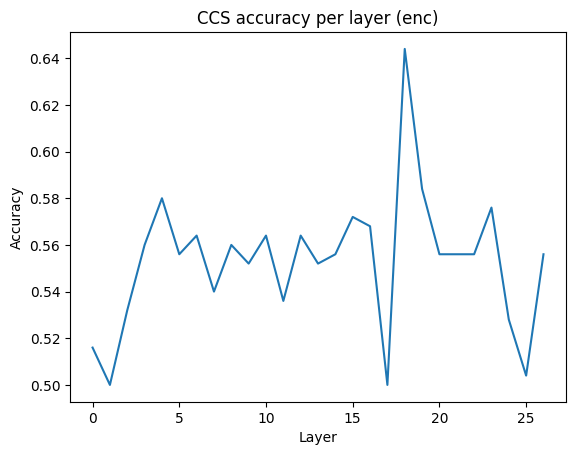

► Best enc layer = 18  (acc=0.644)


In [6]:
YOUR_NAME = "t5gemma-2b-2b-ul2"
hate_data = pd.read_csv('../data/raw/total_hate3.0.csv', index_col=0)
X_pos_enc = np.load(f"{YOUR_NAME}_enc_pos_mean_ttt.npz")['arr_0']
X_neg_enc = np.load(f"{YOUR_NAME}_enc_neg_mean_ttt.npz")['arr_0']
best_enc_layer = run_ccs(X_pos_enc, X_neg_enc, tower_tag='enc')

Median normalize used
Layer 1/27, CCS accuracy: 0.516
Median normalize used
Layer 2/27, CCS accuracy: 0.56
Median normalize used
Layer 3/27, CCS accuracy: 0.592
Median normalize used
Layer 4/27, CCS accuracy: 0.5760000000000001
Median normalize used
Layer 5/27, CCS accuracy: 0.568
Median normalize used
Layer 6/27, CCS accuracy: 0.596
Median normalize used
Layer 7/27, CCS accuracy: 0.5760000000000001
Median normalize used
Layer 8/27, CCS accuracy: 0.604
Median normalize used
Layer 9/27, CCS accuracy: 0.556
Median normalize used
Layer 10/27, CCS accuracy: 0.628
Median normalize used
Layer 11/27, CCS accuracy: 0.624
Median normalize used
Layer 12/27, CCS accuracy: 0.628
Median normalize used
Layer 13/27, CCS accuracy: 0.528
Median normalize used
Layer 14/27, CCS accuracy: 0.62
Median normalize used
Layer 15/27, CCS accuracy: 0.616
Median normalize used
Layer 16/27, CCS accuracy: 0.536
Median normalize used
Layer 17/27, CCS accuracy: 0.636
Median normalize used
Layer 18/27, CCS accuracy: 0

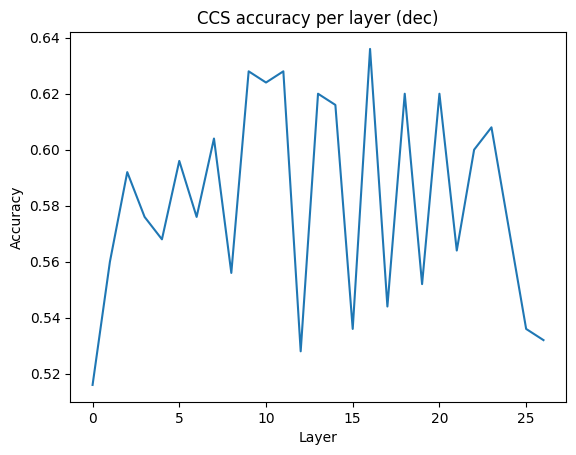

► Best dec layer = 16  (acc=0.636)


In [ ]:
YOUR_NAME = "t5gemma-2b-2b-ul2"
hate_data = pd.read_csv('../data/raw/total_hate3.0.csv', index_col=0)
X_pos_dec = np.load(f"{YOUR_NAME}_dec_pos_last-token_ttt.npz")['arr_0']
X_neg_dec = np.load(f"{YOUR_NAME}_dec_neg_last-token_ttt.npz")['arr_0']
best_dec_layer = run_ccs(X_pos_dec, X_neg_dec, tower_tag='dec')

In [ ]:
from ccs import CCS
import pandas as pd, numpy as np, pickle
from sklearn.model_selection import train_test_split

def single_layer_ccs(X_pos_norm, X_neg_norm, best_layer, *, tower_tag):
    # Slice out the chosen layer
    X_pos_layer = pd.DataFrame(X_pos_norm[:, best_layer])
    X_neg_layer = pd.DataFrame(X_neg_norm[:, best_layer])

    idx = np.arange(len(X_pos_norm))
    train_idx, test_idx = train_test_split(idx, test_size=0.2,
                                           random_state=71, shuffle=True)

    # Train/test split
    X_pos_train = X_pos_layer.loc[train_idx].values.astype(np.float32)
    X_pos_test  = X_pos_layer.loc[test_idx].values.astype(np.float32)
    X_neg_train = X_neg_layer.loc[train_idx].values.astype(np.float32)
    X_neg_test  = X_neg_layer.loc[test_idx].values.astype(np.float32)

    y_train = hate_data['is_harmfull_opposition'][train_idx]
    y_test  = hate_data['is_harmfull_opposition'][test_idx]

    # Median normalise in‑place
    X_pos_train -= np.median(X_pos_train); X_pos_test -= np.median(X_pos_train)
    X_neg_train -= np.median(X_neg_train); X_neg_test -= np.median(X_neg_train)

    # CCS without labels (NEG first, then POS)
    ccs = CCS(X_neg_train, X_pos_train, y_train.values,
              var_normalize=False, lambda_classification=0,
              predict_normalize=False)
    ccs.repeated_train()

    acc = ccs.get_acc(X_neg_test, X_pos_test, y_test.values)
    print(f'CCS accuracy ({tower_tag}, layer {best_layer}) = {acc:.3f}')

    with open(f'ccs_{YOUR_NAME}_{tower_tag}_ttt_l{best_layer}.pkl', 'wb') as f:
        pickle.dump(ccs, f)

# Run for both towers
single_layer_ccs(X_pos_enc, X_neg_enc, best_enc_layer, tower_tag='enc')
single_layer_ccs(X_pos_dec, X_neg_dec, best_dec_layer, tower_tag='dec')


CCS accuracy (enc, layer 13) = 0.516
CCS accuracy (dec, layer 16) = 0.612


## **7. Plot results tables.**

In [38]:
from format_results import get_results_table
orig_ccs_data = get_results_table(orig_ccs)

NameError: name 'orig_ccs' is not defined

In [ ]:
fig, ax = plt.subplots(figsize=(18, 5))

plt.plot(orig_ccs_data['accuracy'], label='Orig_CCS')

plt.hlines(1, 0, 7, label='ideal', colors='red', linewidth=3, linestyles=['--'])

plt.xlabel('Layer_number')
plt.ylabel('accuracy score ')
plt.legend(loc='upper right');

In [ ]:
from format_results import get_results_table
orig_ccs_data = get_results_table(orig_ccs)

fig, ax = plt.subplots(figsize=(18, 5))

plt.plot(orig_ccs_data['contradiction idx ↓'], label='Orig_CCS')

plt.hlines(0, 0, 7, label='ideal', colors='red', linewidth=3, linestyles=['--'])

plt.xlabel('Layer_number')
plt.ylabel('Contradiction idx score ')
plt.legend(loc='upper right');

In [ ]:
fig, ax = plt.subplots(figsize=(18, 5))

plt.plot(orig_ccs_data['agreement_score ↓'], label='Orig_CCS')

plt.hlines(0, 0, 7, label='ideal', colors='red', linewidth=3, linestyles=['--'])

plt.xlabel('Layer_number')
plt.ylabel('Agreement score ')
plt.legend(loc='upper right');